<a href="https://colab.research.google.com/github/dead96pool/AIDM/blob/main/AIDM_TABA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder

In [3]:
df = pd.read_csv("/content/drive/MyDrive/datasets/BenignAndMaliciousDataset.csv")

In [4]:
display(df)

,Domain,DNSRecordType,MXDnsResponse,TXTDnsResponse,HasSPFInfo,HasDkimInfo,HasDmarcInfo,Ip,DomainInAlexaDB,CommonPorts,...,ConsoantRatio,NumericRatio,SpecialCharRatio,VowelRatio,ConsoantSequence,VowelSequence,NumericSequence,SpecialCharSequence,DomainLength,Class
0,4455,A,False,False,False,False,False,16984,False,False,...,0.6,0.1,0.0,0.2,10,4,1,0,134,1
1,4456,A,False,False,False,False,False,16984,False,False,...,0.7,0.1,0.0,0.2,12,2,2,1,123,1
2,4457,A,False,False,False,False,False,16984,False,False,...,0.6,0.2,0.0,0.2,16,2,3,0,150,1
3,4458,A,False,False,False,False,False,16984,False,False,...,0.6,0.1,0.0,0.1,9,1,2,0,122,1
4,4459,A,False,False,False,False,False,16984,False,False,...,0.6,0.2,0.0,0.1,10,2,2,0,151,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
89995,75661,A,False,False,False,False,False,16984,False,False,...,0.5,0.2,0.0,0.2,4,1,2,0,27,0
89996,54843,A,False,False,False,False,False,16984,False,False,...,0.6,0.0,0.0,0.4,3,2,0,0,26,0
89997,71235,A,False,False,False,False,False,16984,False,False,...,0.5,0.1,0.0,0.4,3,2,2,0,31,0
89998,82994,A,True,True,True,False,False,7723,False,False,...,0.5,0.0,0.0,0.4,4,2,0,0,11,0


In [11]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 90000 entries, 0 to 89999
Data columns (total 34 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Domain               90000 non-null  int64  
 1   DNSRecordType        90000 non-null  object 
 2   MXDnsResponse        90000 non-null  bool   
 3   TXTDnsResponse       90000 non-null  bool   
 4   HasSPFInfo           90000 non-null  bool   
 5   HasDkimInfo          90000 non-null  bool   
 6   HasDmarcInfo         90000 non-null  bool   
 7   Ip                   90000 non-null  int64  
 8   DomainInAlexaDB      90000 non-null  bool   
 9   CommonPorts          90000 non-null  bool   
 10  CountryCode          60948 non-null  object 
 11  RegisteredCountry    12226 non-null  object 
 12  CreationDate         90000 non-null  int64  
 13  LastUpdateDate       90000 non-null  int64  
 14  ASN                  90000 non-null  int64  
 15  HttpResponseCode     90000 non-null 

# EDA

In [17]:
print("Null values (Percent):\n")
print((df.isna().sum()/len(df))*100)

Null values (Percent):

Domain                  0.000000
DNSRecordType           0.000000
MXDnsResponse           0.000000
TXTDnsResponse          0.000000
HasSPFInfo              0.000000
HasDkimInfo             0.000000
HasDmarcInfo            0.000000
Ip                      0.000000
DomainInAlexaDB         0.000000
CommonPorts             0.000000
CountryCode            32.280000
RegisteredCountry      86.415556
CreationDate            0.000000
LastUpdateDate          0.000000
ASN                     0.000000
HttpResponseCode        0.000000
RegisteredOrg          39.323333
SubdomainNumber         0.000000
Entropy                 0.000000
EntropyOfSubDomains     0.000000
StrangeCharacters       0.000000
TLD                     0.188889
IpReputation            0.000000
DomainReputation        0.000000
ConsoantRatio           0.000000
NumericRatio            0.000000
SpecialCharRatio        0.000000
VowelRatio              0.000000
ConsoantSequence        0.000000
VowelSequence      

In [387]:
# Summary statistics
print("\nSummary statistics:")
display(df.describe())


Summary statistics:


,Domain,Ip,CreationDate,LastUpdateDate,ASN,HttpResponseCode,SubdomainNumber,Entropy,EntropyOfSubDomains,StrangeCharacters,ConsoantRatio,NumericRatio,SpecialCharRatio,VowelRatio,ConsoantSequence,VowelSequence,NumericSequence,SpecialCharSequence,DomainLength,Class
count,90000.000000,90000.000000,90000.000000,90000.000000,90000.000000,90000.000000,90000.000000,90000.000000,90000.000000,90000.000000,90000.000000,90000.000000,90000.000000,90000.000000,90000.000000,90000.000000,90000.000000,90000.000000,90000.000000,90000.000000
mean,44999.500000,13479.648033,1.933611,2.365744,23335.808167,0.667033,103.069200,2.866844,0.003178,3.498011,0.459519,0.144281,0.006526,0.261528,2.719222,1.342756,1.516478,0.112378,26.440422,0.500000
std,25980.906451,4160.266410,1.997232,1.935509,37004.865724,1.203285,4243.802846,0.488291,0.081042,4.471591,0.146031,0.147331,0.026162,0.098600,1.699339,0.554527,1.538932,0.431967,22.341135,0.500003
min,0.000000,0.000000,0.000000,0.000000,-1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.000000,0.000000
25%,22499.750000,11709.750000,0.000000,0.000000,-1.000000,0.000000,0.000000,3.000000,0.000000,0.000000,0.300000,0.000000,0.000000,0.200000,2.000000,1.000000,0.000000,0.000000,15.000000,0.000000
50%,44999.500000,14626.000000,0.000000,4.000000,26228.000000,0.000000,0.000000,3.000000,0.000000,1.000000,0.500000,0.100000,0.000000,0.200000,2.000000,1.000000,1.000000,0.000000,24.000000,0.500000
75%,67499.250000,16984.000000,4.000000,4.000000,26228.000000,2.000000,57.000000,3.000000,0.000000,7.000000,0.600000,0.300000,0.000000,0.300000,3.000000,2.000000,3.000000,0.000000,31.000000,1.000000
max,89999.000000,16984.000000,4.000000,4.000000,398108.000000,5.000000,661909.000000,5.000000,3.000000,124.000000,1.000000,0.800000,0.900000,0.800000,37.000000,7.000000,45.000000,61.000000,153.000000,1.000000



Correlation heatmap:


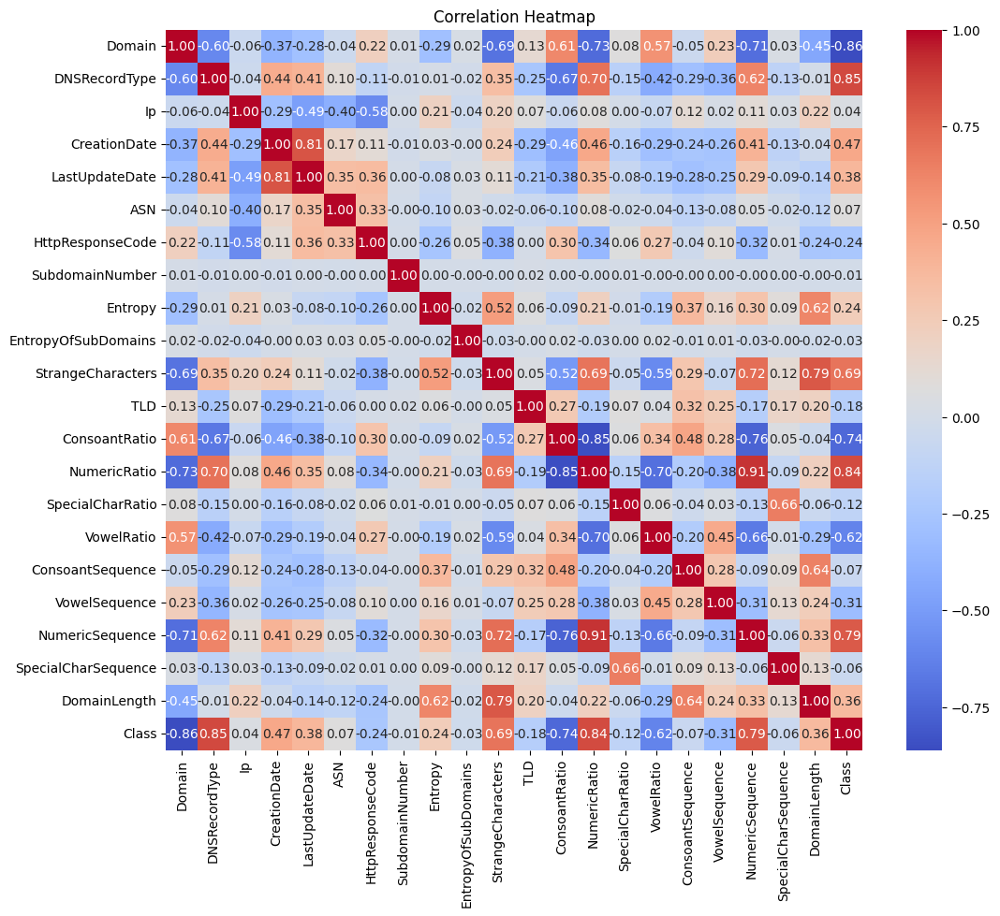

In [388]:
# Correlation heatmap
print("\nCorrelation heatmap:")
plt.figure(figsize=(12, 10))
sns.heatmap(clean_df.corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Heatmap")
plt.show()



Distribution of classes:


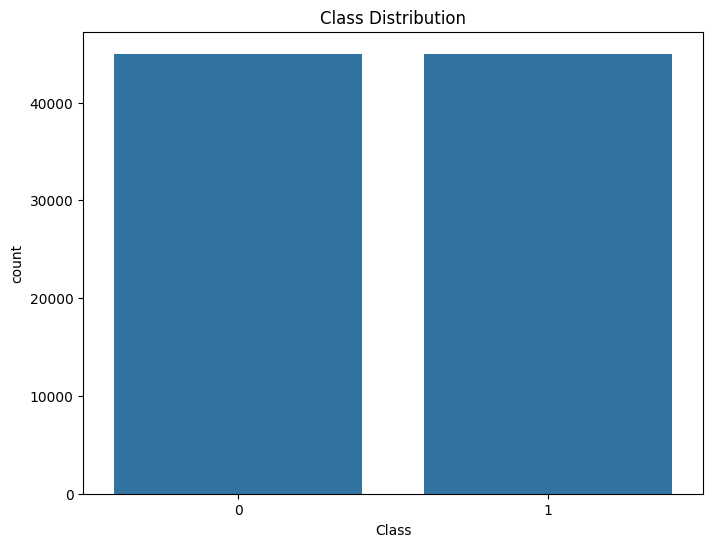

In [389]:
# Distribution of classes
print("\nDistribution of classes:")
plt.figure(figsize=(8, 6))
sns.countplot(x='Class', data=df)
plt.title("Class Distribution")
plt.show()


Distribution of categorical variables:


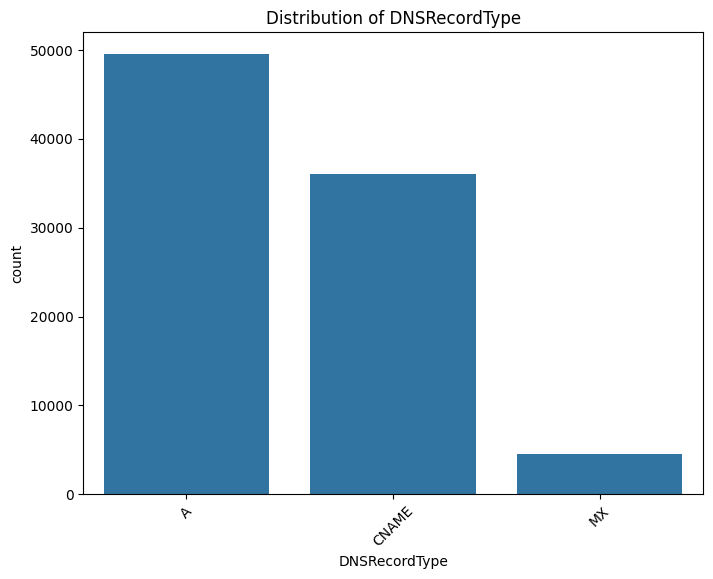

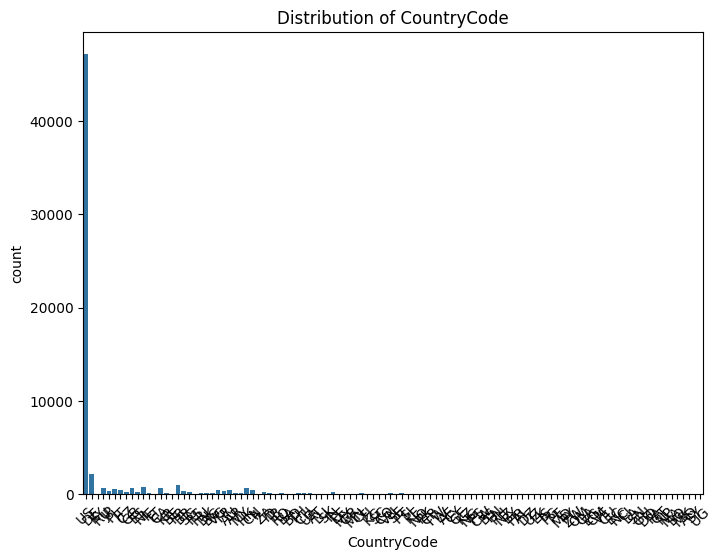

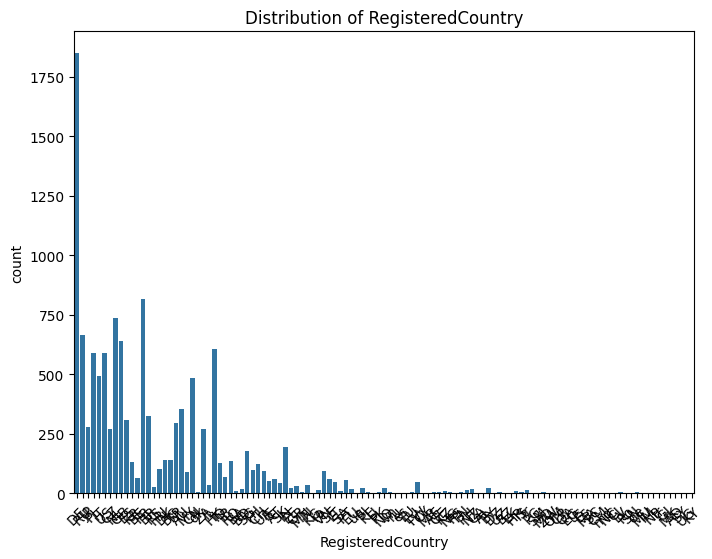

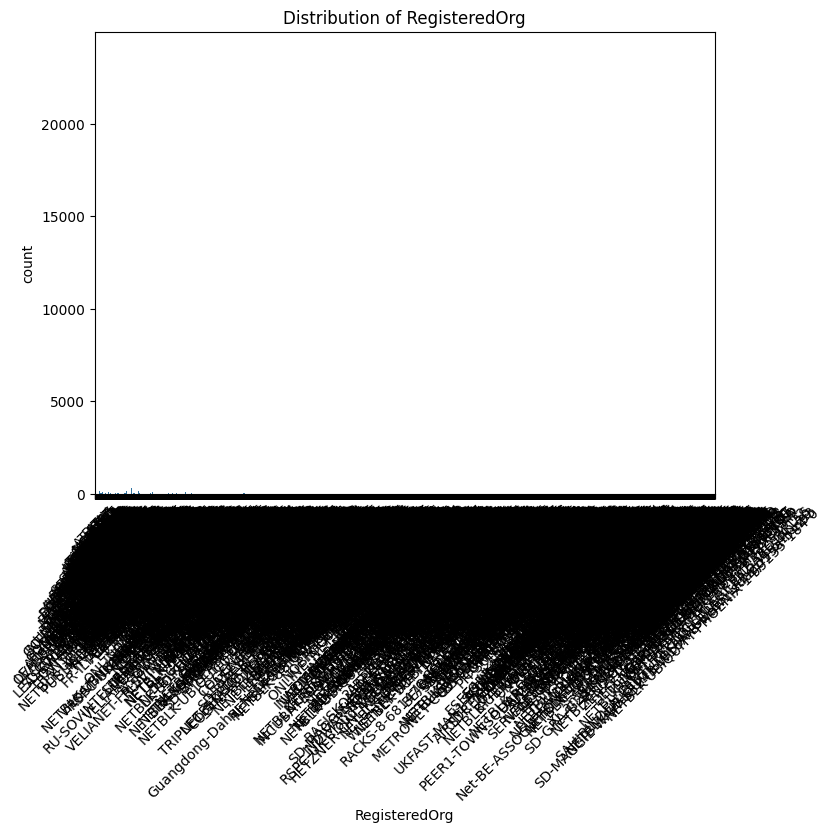

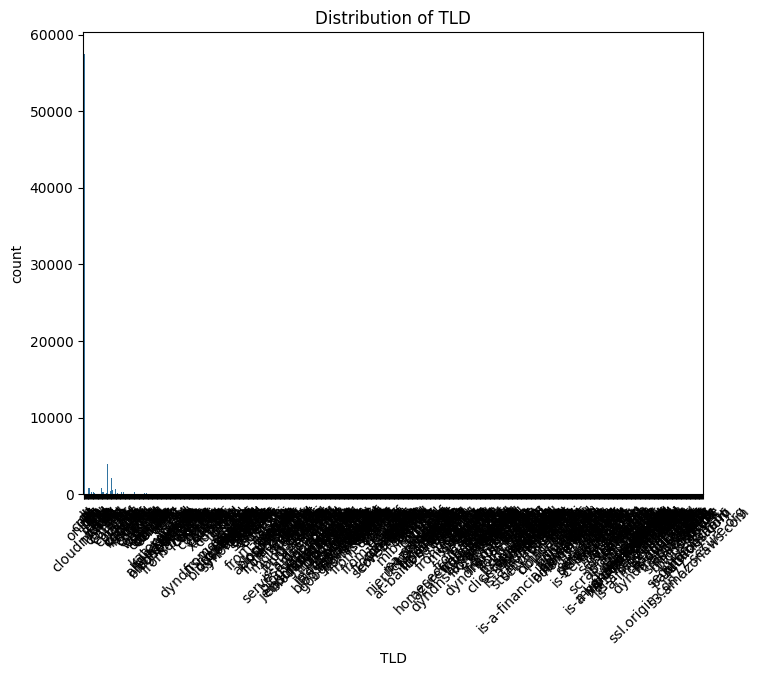

In [390]:
# Distribution of categorical variables
print("\nDistribution of categorical variables:")
for col in df.select_dtypes(include='object'):
    plt.figure(figsize=(8, 6))
    sns.countplot(x=col, data=df)
    plt.title(f"Distribution of {col}")
    plt.xticks(rotation=45)
    plt.show()


Distribution of numerical variables:


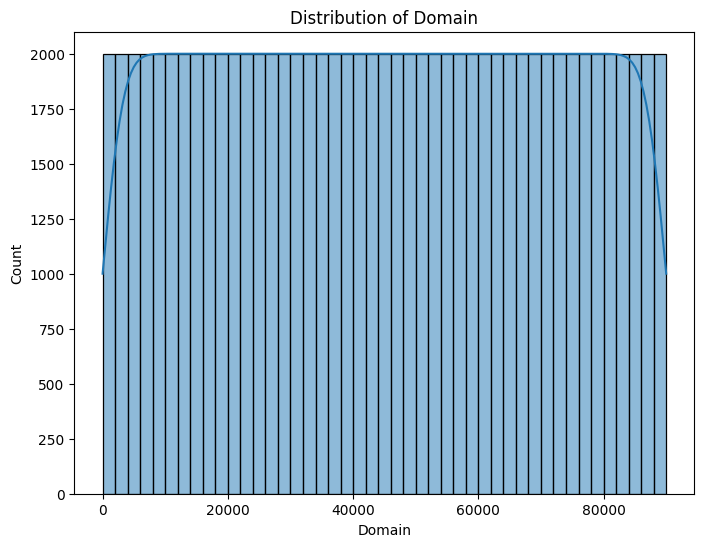

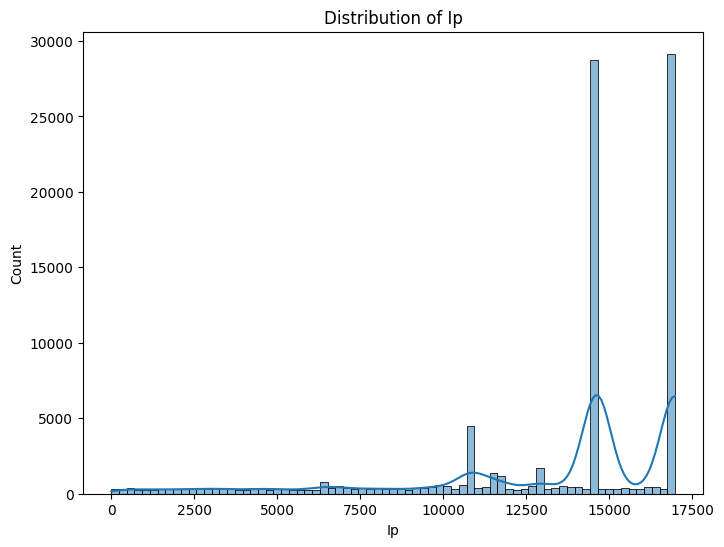

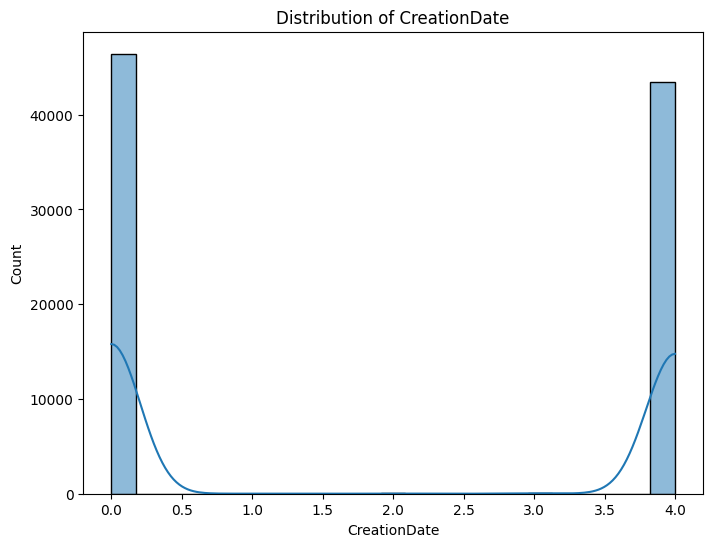

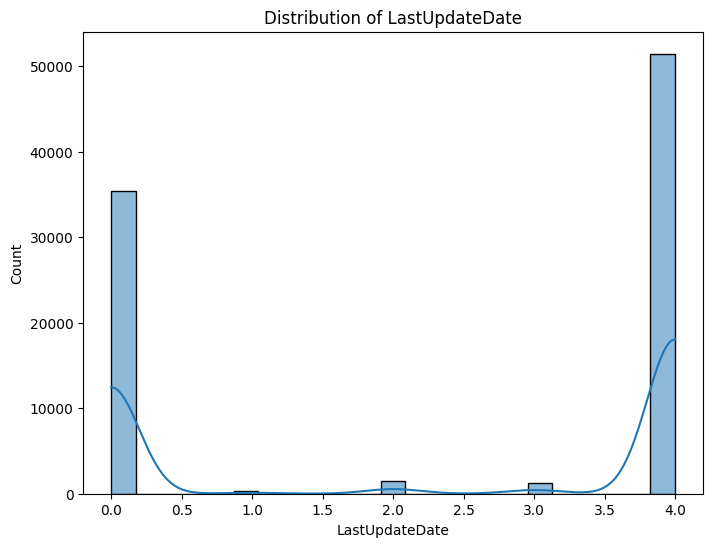

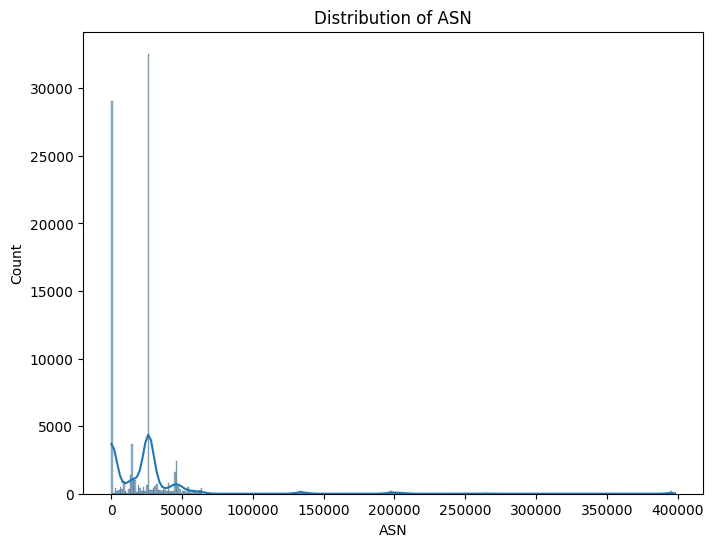

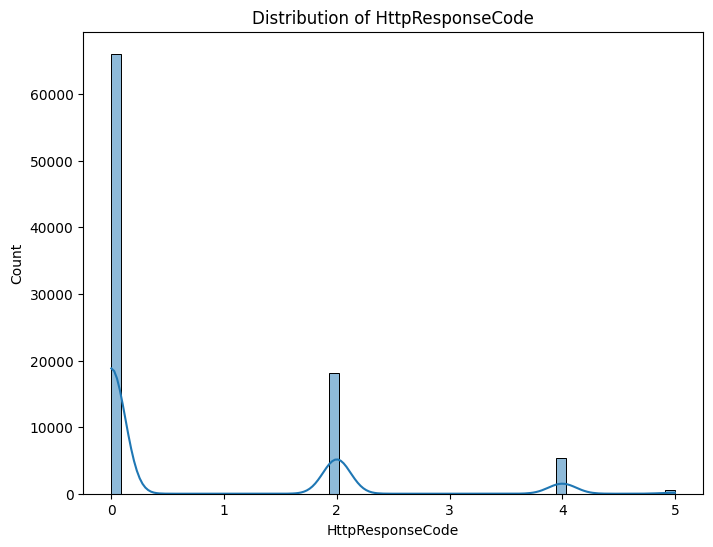

KeyboardInterrupt: 

Error in callback <function flush_figures at 0x7e4f37724280> (for post_execute):


KeyboardInterrupt: 

In [391]:
# Distribution of numerical variables
print("\nDistribution of numerical variables:")
for col in df.select_dtypes(include=['int64', 'float64']):
    plt.figure(figsize=(8, 6))
    sns.histplot(df[col], kde=True)
    plt.title(f"Distribution of {col}")
    plt.show()

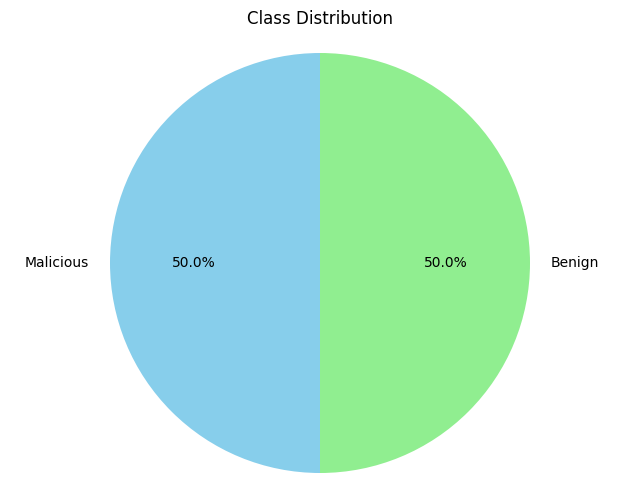

In [393]:
import matplotlib.pyplot as plt

# Calculate class distribution
class_distribution = df['Class'].value_counts(normalize=True) * 100

# Create a donut plot
plt.figure(figsize=(8, 6))
plt.pie(class_distribution, labels=["Malicious", "Benign"], autopct='%1.1f%%', startangle=90, colors=['skyblue', 'lightgreen'])
plt.title('Class Distribution')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.show()


In [395]:
# Summary statistics for categorical variables
print("\nSummary statistics for categorical variables:")
display(df.describe(include=['object']))


Summary statistics for categorical variables:


,DNSRecordType,CountryCode,RegisteredCountry,RegisteredOrg,TLD
count,90000,60948,12226,54609,89830
unique,3,108,113,4377,756
top,A,US,DE,SERVEPATH-BLK2,com
freq,49529,47158,1849,23789,57422


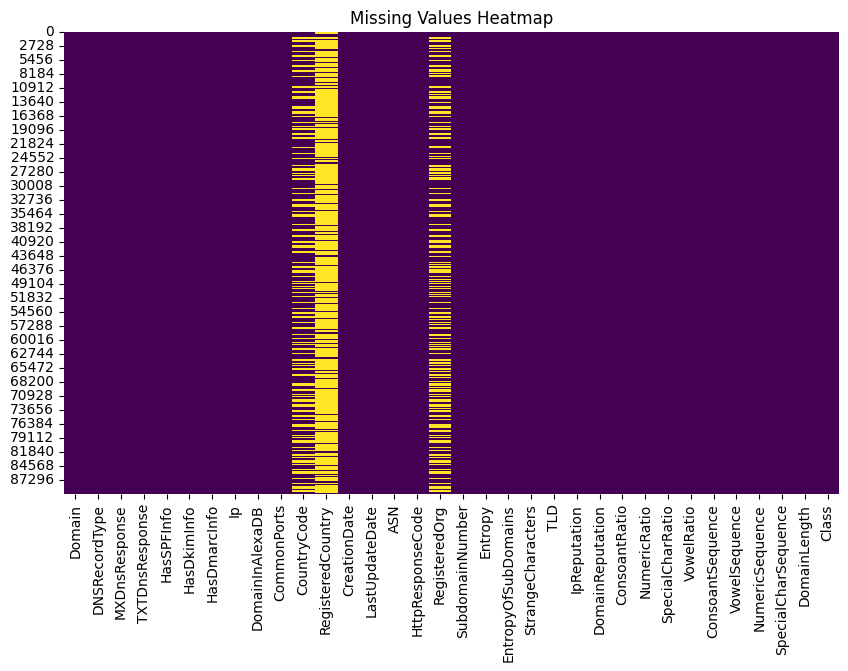


Proportion of missing values in each column:
Domain                  0.000000
DNSRecordType           0.000000
MXDnsResponse           0.000000
TXTDnsResponse          0.000000
HasSPFInfo              0.000000
HasDkimInfo             0.000000
HasDmarcInfo            0.000000
Ip                      0.000000
DomainInAlexaDB         0.000000
CommonPorts             0.000000
CountryCode            32.280000
RegisteredCountry      86.415556
CreationDate            0.000000
LastUpdateDate          0.000000
ASN                     0.000000
HttpResponseCode        0.000000
RegisteredOrg          39.323333
SubdomainNumber         0.000000
Entropy                 0.000000
EntropyOfSubDomains     0.000000
StrangeCharacters       0.000000
TLD                     0.188889
IpReputation            0.000000
DomainReputation        0.000000
ConsoantRatio           0.000000
NumericRatio            0.000000
SpecialCharRatio        0.000000
VowelRatio              0.000000
ConsoantSequence        0.0000

In [396]:
# Visualize missing values using a heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(df.isnull(), cmap='viridis', cbar=False)
plt.title("Missing Values Heatmap")
plt.show()

# Proportion of missing values in each column
missing_values = df.isnull().mean() * 100
print("\nProportion of missing values in each column:")
print(missing_values)


In [397]:
# Pairplot for numerical variables
sns.pairplot(df)
plt.title("Pairplot of Numerical Variables")
plt.show()


KeyboardInterrupt: 

Error in callback <function _draw_all_if_interactive at 0x7e4f37725000> (for post_execute):


KeyboardInterrupt: 

Error in callback <function flush_figures at 0x7e4f37724280> (for post_execute):


KeyboardInterrupt: 

In [14]:
from sklearn.preprocessing import StandardScaler

# Select only the numerical columns
numerical_cols = df.select_dtypes(include=['int64', 'float64']).columns

# Initialize the StandardScaler
scaler = StandardScaler()

# Standardize the numerical columns
df_standardized = df.copy()
df_standardized[numerical_cols] = scaler.fit_transform(df[numerical_cols])



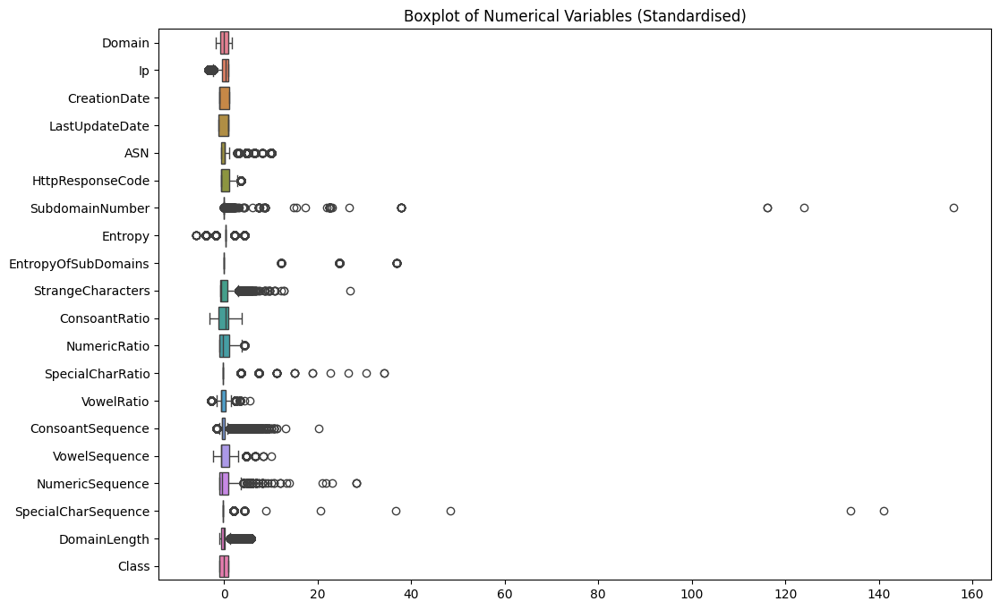

In [18]:
# Boxplots for numerical variables
plt.figure(figsize=(12, 8))
sns.boxplot(data=df_standardized.select_dtypes(include=['int64', 'float64']), orient='h')
plt.title("Boxplot of Numerical Variables (Standardised)")
plt.show()


In [25]:
# Iterate through boolean columns
print("Feature", "\tType", "\tTrue,\t\tFalse")
for col in df.select_dtypes(include='bool').columns:
    # Count True and False values
    true_count = df[col].sum()
    false_count = df.shape[0] - true_count

    # Calculate percentages
    true_percentage = (true_count / df.shape[0]) * 100
    false_percentage = 100 - true_percentage

    # Print results in a tabular form
    print(f"{col}\tBoolean\t{true_count} ({true_percentage:.2f}%), {false_count} ({false_percentage:.2f}%)")


Feature 	Type 	True,		False
MXDnsResponse	Boolean	22543 (25.05%), 67457 (74.95%)
TXTDnsResponse	Boolean	45441 (50.49%), 44559 (49.51%)
HasSPFInfo	Boolean	44221 (49.13%), 45779 (50.87%)
HasDkimInfo	Boolean	22 (0.02%), 89978 (99.98%)
HasDmarcInfo	Boolean	1791 (1.99%), 88209 (98.01%)
DomainInAlexaDB	Boolean	2125 (2.36%), 87875 (97.64%)
CommonPorts	Boolean	11850 (13.17%), 78150 (86.83%)
IpReputation	Boolean	4063 (4.51%), 85937 (95.49%)
DomainReputation	Boolean	108 (0.12%), 89892 (99.88%)


In [26]:
# Calculate mean for numerical features
mean_values = df.select_dtypes(include=['int64', 'float64']).mean()

# Calculate standard deviation for numerical features
std_values = df.select_dtypes(include=['int64', 'float64']).std()

# Combine mean and standard deviation into a DataFrame
stats_df = pd.DataFrame({'Mean': mean_values, 'Standard Deviation': std_values})

# Print the DataFrame
print(stats_df)


                             Mean  Standard Deviation
Domain               44999.500000        25980.906451
Ip                   13479.648033         4160.266410
CreationDate             1.933611            1.997232
LastUpdateDate           2.365744            1.935509
ASN                  23335.808167        37004.865724
HttpResponseCode         0.667033            1.203285
SubdomainNumber        103.069200         4243.802846
Entropy                  2.866844            0.488291
EntropyOfSubDomains      0.003178            0.081042
StrangeCharacters        3.498011            4.471591
ConsoantRatio            0.459519            0.146031
NumericRatio             0.144281            0.147331
SpecialCharRatio         0.006526            0.026162
VowelRatio               0.261528            0.098600
ConsoantSequence         2.719222            1.699339
VowelSequence            1.342756            0.554527
NumericSequence          1.516478            1.538932
SpecialCharSequence      0.1

In [30]:
for col in df.columns:
    print(col, df[col].nunique())

Domain 90000
DNSRecordType 3
MXDnsResponse 2
TXTDnsResponse 2
HasSPFInfo 2
HasDkimInfo 2
HasDmarcInfo 2
Ip 16985
DomainInAlexaDB 2
CommonPorts 2
CountryCode 108
RegisteredCountry 113
CreationDate 5
LastUpdateDate 5
ASN 1976
HttpResponseCode 4
RegisteredOrg 4377
SubdomainNumber 207
Entropy 6
EntropyOfSubDomains 4
StrangeCharacters 47
TLD 756
IpReputation 2
DomainReputation 2
ConsoantRatio 11
NumericRatio 9
SpecialCharRatio 10
VowelRatio 9
ConsoantSequence 25
VowelSequence 8
NumericSequence 26
SpecialCharSequence 9
DomainLength 150
Class 2


In [38]:
# removing columns with large null values

clean_df = df.drop(["CountryCode", "RegisteredCountry", "RegisteredOrg"], axis = 1)

In [48]:
# removing null values
clean_df = clean_df.dropna(ignore_index = True)

In [40]:
clean_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 89830 entries, 0 to 89999
Data columns (total 31 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Domain               89830 non-null  int64  
 1   DNSRecordType        89830 non-null  object 
 2   MXDnsResponse        89830 non-null  bool   
 3   TXTDnsResponse       89830 non-null  bool   
 4   HasSPFInfo           89830 non-null  bool   
 5   HasDkimInfo          89830 non-null  bool   
 6   HasDmarcInfo         89830 non-null  bool   
 7   Ip                   89830 non-null  int64  
 8   DomainInAlexaDB      89830 non-null  bool   
 9   CommonPorts          89830 non-null  bool   
 10  CreationDate         89830 non-null  int64  
 11  LastUpdateDate       89830 non-null  int64  
 12  ASN                  89830 non-null  int64  
 13  HttpResponseCode     89830 non-null  int64  
 14  SubdomainNumber      89830 non-null  int64  
 15  Entropy              89830 non-null  int6

In [41]:
# encoding object data for TLD

enc_tld = LabelEncoder()
clean_df["TLD"] = enc_tld.fit_transform(clean_df["TLD"])

In [42]:
tld_encoding_mapping = {tld: encoding for tld, encoding in zip(enc_tld.classes_, enc_tld.transform(enc_tld.classes_))}
print(tld_encoding_mapping)

{'3utilities.com': 0, 'ac.at': 1, 'ac.cn': 2, 'ac.cr': 3, 'ac.id': 4, 'ac.in': 5, 'ac.ir': 6, 'ac.jp': 7, 'ac.ke': 8, 'ac.mw': 9, 'ac.th': 10, 'ac.tz': 11, 'ac.ug': 12, 'ac.uk': 13, 'academy': 14, 'adm.br': 15, 'adv.br': 16, 'ae': 17, 'aero': 18, 'af': 19, 'africa': 20, 'agency': 21, 'ai': 22, 'al': 23, 'al.gov.br': 24, 'alsace': 25, 'altervista.org': 26, 'am': 27, 'am.gov.br': 28, 'amsterdam': 29, 'app': 30, 'apps.lair.io': 31, 'appspot.com': 32, 'archi': 33, 'army': 34, 'arq.br': 35, 'art.pl': 36, 'as': 37, 'asia': 38, 'asn.au': 39, 'at': 40, 'at-band-camp.net': 41, 'audio': 42, 'av.tr': 43, 'az': 44, 'azurewebsites.net': 45, 'ba': 46, 'ba.gov.br': 47, 'band': 48, 'be': 49, 'beep.pl': 50, 'beer': 51, 'bel.tr': 52, 'belluno.it': 53, 'best': 54, 'bg': 55, 'bi': 56, 'bid': 57, 'biz': 58, 'biz.id': 59, 'biz.pl': 60, 'biz.ua': 61, 'black': 62, 'blog': 63, 'blog.br': 64, 'blogdns.org': 65, 'blogspot.be': 66, 'blogspot.bg': 67, 'blogspot.ca': 68, 'blogspot.co.id': 69, 'blogspot.co.uk': 70, 

In [43]:
# encoding obj for DNSRecordType

enc_dns_rec_type = LabelEncoder()
clean_df["DNSRecordType"] = enc_dns_rec_type.fit_transform(clean_df["DNSRecordType"])

In [44]:
dns_rec_encoding_mapping = {dns: encoding for dns, encoding in zip(enc_dns_rec_type.classes_, enc_dns_rec_type.transform(enc_dns_rec_type.classes_))}
print(dns_rec_encoding_mapping)

{'A': 0, 'CNAME': 1, 'MX': 2}


In [51]:
# boolean data encoding

boolean_features = ['MXDnsResponse', 'TXTDnsResponse', 'HasSPFInfo', 'HasDkimInfo',
                    'HasDmarcInfo', 'DomainInAlexaDB', 'CommonPorts', 'IpReputation',
                    'DomainReputation']


binary_encoded_df = pd.get_dummies(clean_df[boolean_features], drop_first=True)

clean_df = pd.concat([clean_df, binary_encoded_df], axis=1)

clean_df.drop(columns=boolean_features, inplace=True)

#print(df.head())


In [288]:
display(clean_df.iloc[:,2:])

,Ip,CreationDate,LastUpdateDate,ASN,HttpResponseCode,SubdomainNumber,Entropy,EntropyOfSubDomains,StrangeCharacters,TLD,ConsoantRatio,NumericRatio,SpecialCharRatio,VowelRatio,ConsoantSequence,VowelSequence,NumericSequence,SpecialCharSequence,DomainLength,Class
0,16984,0,0,-1,0,0,4,0,11,543,0.6,0.1,0.0,0.2,10,4,1,0,134,1
1,16984,0,0,-1,0,0,4,0,11,543,0.7,0.1,0.0,0.2,12,2,2,1,123,1
2,16984,0,0,-1,0,0,4,0,24,543,0.6,0.2,0.0,0.2,16,2,3,0,150,1
3,16984,0,0,-1,0,0,4,0,15,543,0.6,0.1,0.0,0.1,9,1,2,0,122,1
4,16984,0,0,-1,0,0,4,0,23,543,0.6,0.2,0.0,0.1,10,2,2,0,151,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
89825,16984,0,0,-1,0,0,3,0,3,705,0.5,0.2,0.0,0.2,4,1,2,0,27,0
89826,16984,0,0,-1,0,0,3,0,0,630,0.6,0.0,0.0,0.4,3,2,0,0,26,0
89827,16984,0,0,-1,0,0,3,0,1,533,0.5,0.1,0.0,0.4,3,2,2,0,31,0
89828,7723,4,4,46606,4,0,3,0,0,17,0.5,0.0,0.0,0.4,4,2,0,0,11,0


In [58]:
# feature selection


In [235]:
import pandas as pd
import numpy as np
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif

# Assuming df is your DataFrame
# Separate features (X) and target variable (y)
#X = clean_df.drop(columns=['Class'])  # Features
#y = clean_df['Class']  # Target variable

# Perform SelectKBest feature selection using ANOVA F-value
selector = SelectKBest(score_func=f_classif, k=15)
selected_features = selector.fit(X, y)

# Get the indices of the selected features
selected_feature_indices = selected_features.get_support(indices=True)

# Get the names of the selected features
selected_feature_names = X.columns[selected_feature_indices]

# Create a DataFrame with selected features
selected_df = clean_df[selected_feature_names]

# Display the DataFrame with selected features
print(selected_feature_names)


Index(['CreationDate', 'LastUpdateDate', 'ASN', 'HttpResponseCode', 'Entropy',
       'StrangeCharacters', 'TLD', 'ConsoantRatio', 'NumericRatio',
       'SpecialCharRatio', 'VowelRatio', 'ConsoantSequence', 'VowelSequence',
       'NumericSequence', 'DomainLength'],
      dtype='object')


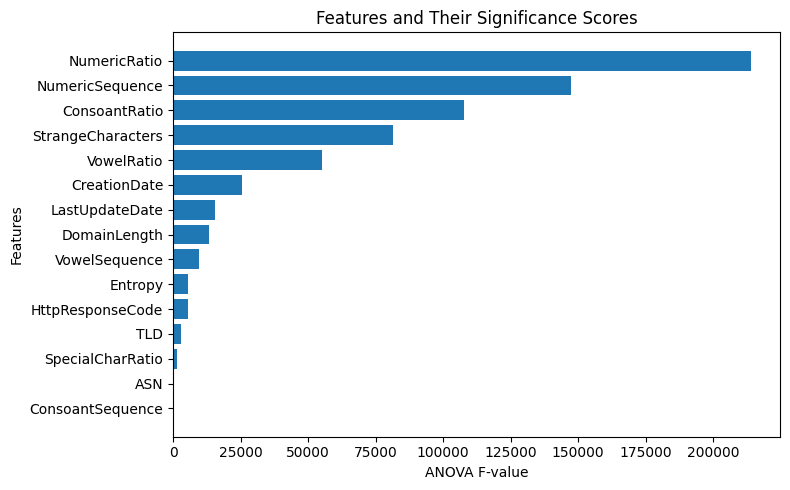

In [236]:
import matplotlib.pyplot as plt

# Get the ANOVA F-values of the selected features
feature_scores = selected_features.scores_[selected_feature_indices]

# Sort the features and their scores by ANOVA F-values in ascending order
sorted_indices = np.argsort(feature_scores)
sorted_feature_names = selected_feature_names[sorted_indices]
sorted_feature_scores = feature_scores[sorted_indices]

# Plot the selected features with their significance scores
plt.figure(figsize=(8, 5))  # Adjust figure size as needed
plt.barh(range(len(sorted_feature_names)), sorted_feature_scores, align='center')
plt.yticks(range(len(sorted_feature_names)), sorted_feature_names)  # Set y-axis labels
plt.xlabel('ANOVA F-value')
plt.ylabel('Features')
plt.title('Features and Their Significance Scores')
plt.tight_layout()
plt.show()


In [78]:
selected_features = sorted_feature_names
selected_feat_df = clean_df[selected_features]

In [79]:
selected_feat_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 89830 entries, 0 to 89829
Data columns (total 15 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   SpecialCharRatio   89830 non-null  float64
 1   TLD                89830 non-null  int64  
 2   HttpResponseCode   89830 non-null  int64  
 3   Entropy            89830 non-null  int64  
 4   VowelSequence      89830 non-null  int64  
 5   DomainLength       89830 non-null  int64  
 6   LastUpdateDate     89830 non-null  int64  
 7   CreationDate       89830 non-null  int64  
 8   VowelRatio         89830 non-null  float64
 9   StrangeCharacters  89830 non-null  int64  
 10  ConsoantRatio      89830 non-null  float64
 11  NumericSequence    89830 non-null  int64  
 12  NumericRatio       89830 non-null  float64
 13  DNSRecordType      89830 non-null  int64  
 14  Domain             89830 non-null  int64  
dtypes: float64(4), int64(11)
memory usage: 10.3 MB


# ML model

In [82]:
X_feat_sel = selected_feat_df
y = y
X = clean_df.drop(columns=["Class"])  # Features
y = clean_df["Class"]  # Target variable


89830


In [256]:
X = clean_df.drop(columns = ["Class", "Domain", "DNSRecordType"])

In [98]:
print("Feature seelcted X: \t\t", X_feat_sel.shape)
print("without feature seelction X: \t", X.shape)
print("target (y): \t\t\t", y.shape)

Feature seelcted X: 		 (89830, 15)
without feature seelction X: 	 (89830, 21)
target (y): 			 (89830,)


In [257]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, average_precision_score, log_loss
from sklearn.metrics import precision_recall_curve, roc_curve
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, f1_score, precision_score, recall_score


# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

## XGBoost

In [206]:
# XGBoost

import xgboost as xgb


# Initialize XGBoost classifier
xgb_clf = xgb.XGBClassifier(objective='binary:logistic', random_state=42)

# Train the classifier
xgb_clf.fit(X_train, y_train)

# Predict on the test set
xgb_y_pred = xgb_clf.predict(X_test)



Confusion Matrix:


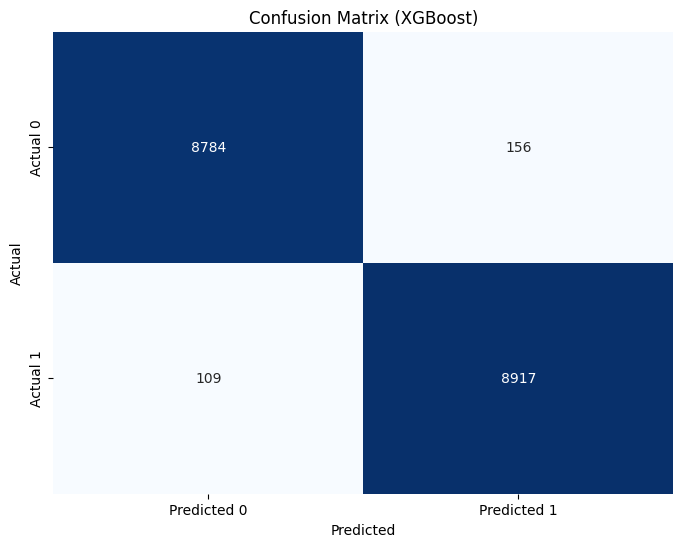

Classification Report (XGBoost):
              precision    recall  f1-score   support

           0       0.99      0.98      0.99      8940
           1       0.98      0.99      0.99      9026

    accuracy                           0.99     17966
   macro avg       0.99      0.99      0.99     17966
weighted avg       0.99      0.99      0.99     17966



In [207]:
# Confusion Matrix
xgb_conf_matrix = confusion_matrix(y_test, xgb_y_pred)
print("Confusion Matrix:")
# print(xgb_conf_matrix)
# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(xgb_conf_matrix, annot=True, fmt="d", cmap="Blues", cbar=False,
            xticklabels=["Predicted 0", "Predicted 1"],
            yticklabels=["Actual 0", "Actual 1"])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix (XGBoost)")
plt.show()

# Classification Report
xgb_class_report = classification_report(y_test, xgb_y_pred)
print("Classification Report (XGBoost):")
print(xgb_class_report)

Accuracy: 0.9852499165089613
Precision: 0.9828061280723024
Recall (Sensitivity): 0.9879237757589187
F1-score: 0.9853583070887895
ROC AUC: 0.9990324558285758


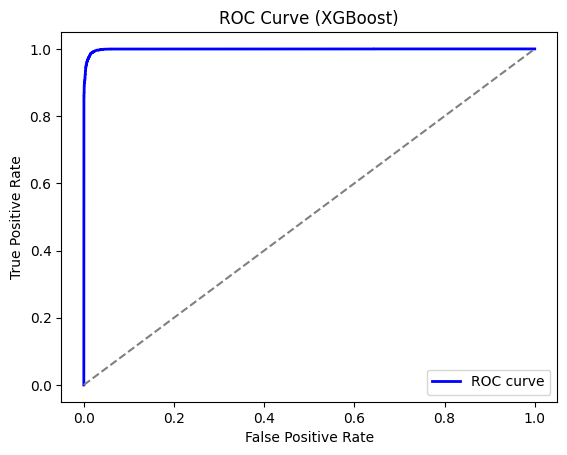

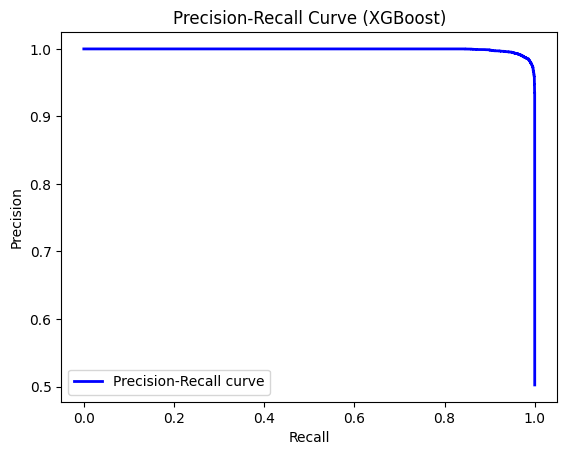

In [208]:
from sklearn.metrics import precision_score, recall_score, f1_score, roc_auc_score, average_precision_score, log_loss
from sklearn.metrics import precision_recall_curve, roc_curve


precision = precision_score(y_test, xgb_y_pred)
recall = recall_score(y_test, xgb_y_pred)
f1 = f1_score(y_test, xgb_y_pred)
roc_auc = roc_auc_score(y_test, xgb_clf.predict_proba(X_test)[:,1])
xgb_accuracy = accuracy_score(y_test, xgb_y_pred)


print("Accuracy:", xgb_accuracy)
print("Precision:", precision)
print("Recall (Sensitivity):", recall)
print("F1-score:", f1)
print("ROC AUC:", roc_auc)


# Plot ROC curve
fpr, tpr, thresholds = roc_curve(y_test, xgb_clf.predict_proba(X_test)[:,1])
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve (XGBoost)')
plt.legend(loc='lower right')
plt.show()

# Plot precision-recall curve
precision, recall, thresholds = precision_recall_curve(y_test, xgb_clf.predict_proba(X_test)[:,1])
plt.plot(recall, precision, color='blue', lw=2, label='Precision-Recall curve')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve (XGBoost)')
plt.legend(loc='lower left')
plt.show()

## LGBM

[LightGBM] [Info] Number of positive: 35901, number of negative: 35963
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009572 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1082
[LightGBM] [Info] Number of data points in the train set: 71864, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.499569 -> initscore=-0.001725
[LightGBM] [Info] Start training from score -0.001725
Validation Accuracy: 0.9864187910497607
Confusion Matrix:


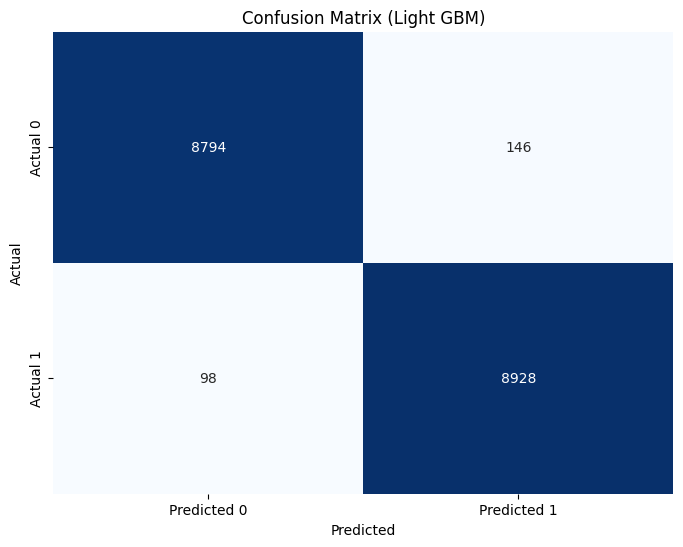

Classification Report (Light GBM):
              precision    recall  f1-score   support

           0       0.99      0.98      0.99      8940
           1       0.98      0.99      0.99      9026

    accuracy                           0.99     17966
   macro avg       0.99      0.99      0.99     17966
weighted avg       0.99      0.99      0.99     17966



In [209]:
from lightgbm import LGBMClassifier

# Light GBM classifier
lgbm = LGBMClassifier(n_estimators=500, random_state=42)

lgbm.fit(X_train, y_train)

# Make predictions
lgbm_y_test_pred = lgbm.predict(X_test)

# Evaluate the model
lgbm_accuracy = accuracy_score(y_test, lgbm_y_test_pred)
print("Validation Accuracy:", lgbm_accuracy)

# Confusion Matrix
lgbm_conf_matrix = confusion_matrix(y_test, lgbm_y_test_pred)
print("Confusion Matrix:")
#print(lgbm_conf_matrix)
# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(lgbm_conf_matrix, annot=True, fmt="d", cmap="Blues", cbar=False,
            xticklabels=["Predicted 0", "Predicted 1"],
            yticklabels=["Actual 0", "Actual 1"])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix (Light GBM)")
plt.show()


# Classification Report
lgbm_class_report = classification_report(y_test, lgbm_y_test_pred)
print("Classification Report (Light GBM):")
print(lgbm_class_report)

Evaluation of Light GBM: 

Precision: 0.9839100727352876
Recall (Sensitivity): 0.9891424772878351
F1-score: 0.9865193370165746
ROC AUC: 0.9991566806010576
Average Precision: 0.9991799398652559
Log Loss: 0.035495914098956284


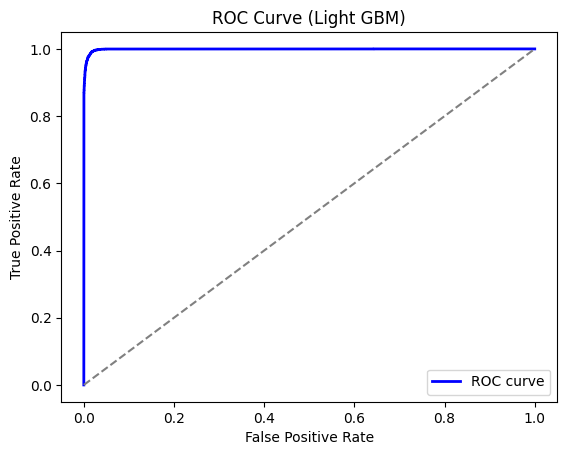

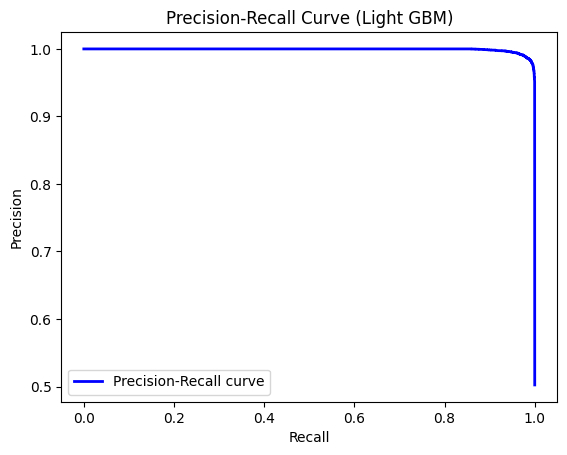

In [210]:
# evaluation
print("Evaluation of Light GBM: \n")


from sklearn.metrics import precision_score, recall_score, f1_score, roc_auc_score, average_precision_score, log_loss
from sklearn.metrics import precision_recall_curve, roc_curve


precision = precision_score(y_test, lgbm_y_test_pred)
recall = recall_score(y_test, lgbm_y_test_pred)
f1 = f1_score(y_test, lgbm_y_test_pred)
roc_auc = roc_auc_score(y_test, lgbm.predict_proba(X_test)[:,1])
average_precision = average_precision_score(y_test, lgbm.predict_proba(X_test)[:,1])
logloss = log_loss(y_test, lgbm.predict_proba(X_test))


# Print the calculated metrics
print("Precision:", precision)
print("Recall (Sensitivity):", recall)
print("F1-score:", f1)
print("ROC AUC:", roc_auc)
print("Average Precision:", average_precision)
print("Log Loss:", logloss)

# Plot ROC curve
fpr, tpr, thresholds = roc_curve(y_test, lgbm.predict_proba(X_test)[:,1])
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve (Light GBM)')
plt.legend(loc='lower right')
plt.show()

# Plot precision-recall curve
precision, recall, thresholds = precision_recall_curve(y_test, lgbm.predict_proba(X_test)[:,1])
plt.plot(recall, precision, color='blue', lw=2, label='Precision-Recall curve')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve (Light GBM)')
plt.legend(loc='lower left')
plt.show()

## CNN

In [258]:
# CNN

from sklearn.preprocessing import StandardScaler
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, Conv1D, MaxPooling1D
from keras.utils import to_categorical
from sklearn.metrics import accuracy_score

# Assuming X_train, X_test, y_train, y_test are already defined

# Standardize the features
scaler = StandardScaler()
X_train_scale = scaler.fit_transform(X_train)
X_test_scale = scaler.transform(X_test)

# Reshape the data for CNN input (reshape to 3D if needed)
# CNN expects input shape: (samples, time_steps, features)
# Here, we reshape to 2D as each sample is a single row
X_train_scale = X_train_scale.reshape(X_train_scale.shape[0], X_train_scale.shape[1], 1)
X_test_scale = X_test_scale.reshape(X_test_scale.shape[0], X_test_scale.shape[1], 1)

# Define the CNN model
model = Sequential()
model.add(Conv1D(filters=32, kernel_size=3, activation='relu', input_shape=(X_train_scale.shape[1], 1)))
model.add(MaxPooling1D(pool_size=2))
model.add(Flatten())
model.add(Dense(50, activation='relu'))
model.add(Dense(1, activation='sigmoid'))  # Output layer for binary classification

# Compile the model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

# Train the model
cnn_history = model.fit(X_train_scale, y_train, epochs=10, batch_size=64, validation_data=(X_test_scale, y_test))

# Evaluate the model
loss, accuracy = model.evaluate(X_test_scale, y_test)
print("Test Accuracy:", accuracy)


Epoch 1/10
1123/1123 [==============================] - 5s 4ms/step - loss: 0.1123 - accuracy: 0.9568 - val_loss: 0.0739 - val_accuracy: 0.9708
Epoch 2/10
1123/1123 [==============================] - 4s 4ms/step - loss: 0.0719 - accuracy: 0.9707 - val_loss: 0.0637 - val_accuracy: 0.9730
Epoch 3/10
1123/1123 [==============================] - 6s 5ms/step - loss: 0.0645 - accuracy: 0.9737 - val_loss: 0.0597 - val_accuracy: 0.9757
Epoch 4/10
1123/1123 [==============================] - 4s 3ms/step - loss: 0.0624 - accuracy: 0.9744 - val_loss: 0.0602 - val_accuracy: 0.9760
Epoch 5/10
1123/1123 [==============================] - 4s 4ms/step - loss: 0.0587 - accuracy: 0.9753 - val_loss: 0.0574 - val_accuracy: 0.9763
Epoch 6/10
1123/1123 [==============================] - 5s 5ms/step - loss: 0.0569 - accuracy: 0.9759 - val_loss: 0.0557 - val_accuracy: 0.9771
Epoch 7/10
1123/1123 [==============================] - 5s 5ms/step - loss: 0.0558 - accuracy: 0.9767 - val_loss: 0.0562 - val_accuracy:

In [259]:
# Predict probabilities on test data
cnn_y_pred_prob = model.predict(X_test_scale)

# Convert probabilities to class labels
cnn_y_pred = (cnn_y_pred_prob > 0.5).astype(int)

562/562 [==============================] - 1s 2ms/step


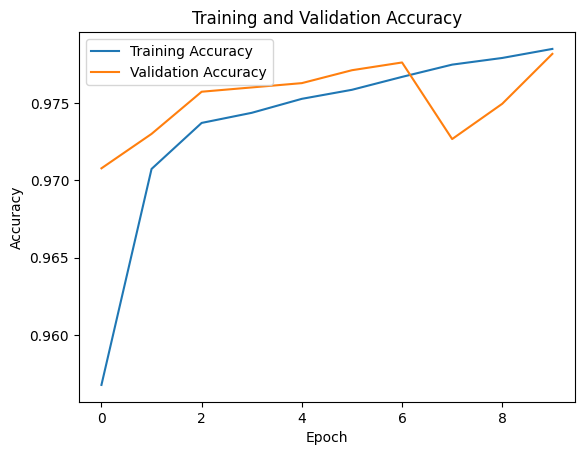

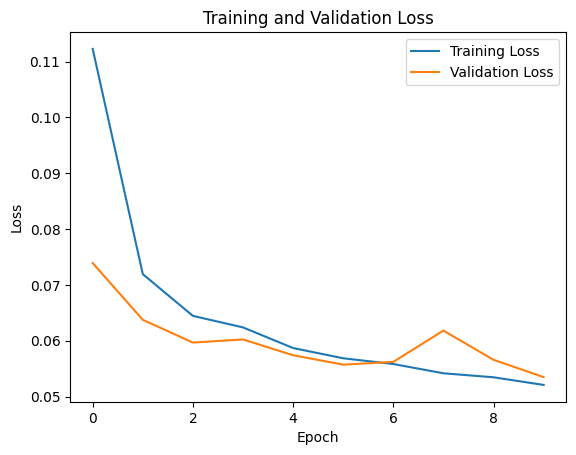

In [260]:
# Plot training accuracy and validation accuracy over epochs
plt.plot(cnn_history.history['accuracy'], label='Training Accuracy')
plt.plot(cnn_history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')
plt.show()

# Plot training loss and validation loss over epochs
plt.plot(cnn_history.history['loss'], label='Training Loss')
plt.plot(cnn_history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.show()


Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.97      0.98      8940
           1       0.97      0.98      0.98      9026

    accuracy                           0.98     17966
   macro avg       0.98      0.98      0.98     17966
weighted avg       0.98      0.98      0.98     17966



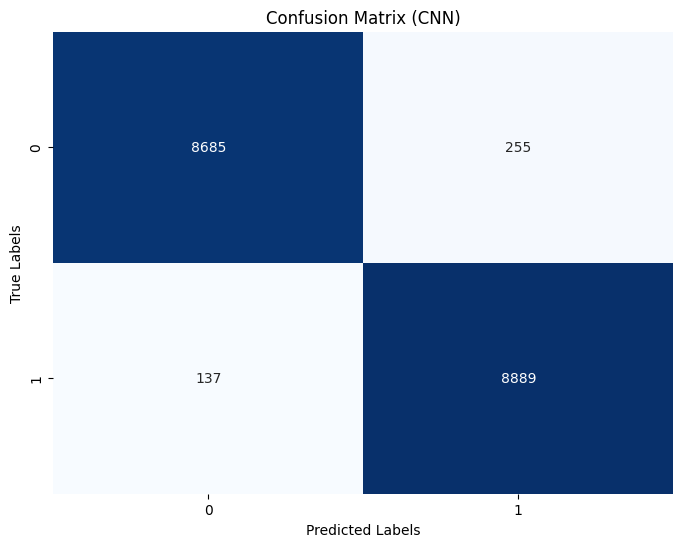

In [271]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Calculate confusion matrix
cm = confusion_matrix(y_test, cnn_y_pred)

# Classification Report
print("Classification Report:")
print(classification_report(y_test, cnn_y_pred))

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix (CNN)")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()


In [262]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score

# Calculate accuracy
accuracy = accuracy_score(y_test, cnn_y_pred)

# Calculate precision
precision = precision_score(y_test, cnn_y_pred)

# Calculate recall (sensitivity)
recall = recall_score(y_test, cnn_y_pred)

# Calculate F1-score
f1 = f1_score(y_test, cnn_y_pred)

# Calculate ROC AUC score
roc_auc = roc_auc_score(y_test, cnn_y_pred_prob)

print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall (Sensitivity):", recall)
print("F1-score:", f1)
print("ROC AUC:", roc_auc)


Accuracy: 0.9781810085717466
Precision: 0.9721128608923885
Recall (Sensitivity): 0.9848216264125859
F1-score: 0.9784259768849752
ROC AUC: 0.9981500807262738


## Plots

562/562 [==============================] - 4s 6ms/step


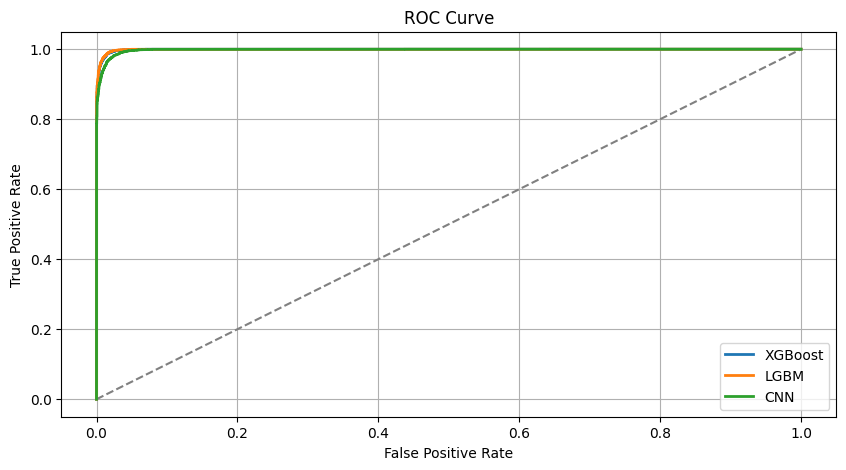

In [311]:
# ROC curve

from sklearn.metrics import roc_curve
import matplotlib.pyplot as plt

# List of model names
model_names = ['XGBoost', 'LGBM', 'CNN']

# List of model predictions
model_clfs = [xgb_clf, lgbm, model]

# Initialize plot for ROC curve
plt.figure(figsize=(10, 5))

# Plot ROC curve for each model except CNN
for model_name, model_clf in zip(model_names[:-1], model_clfs[:-1]):
    y_pred = model_clf.predict_proba(X_test)[:, 1]
    fpr, tpr, thresholds = roc_curve(y_test, y_pred)
    plt.plot(fpr, tpr, lw=2, label=model_name)

# Plot diagonal line (random classifier)
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')

# Plot ROC curve for CNN
y_pred_cnn = model.predict(X_test_scale)  # Get predictions
y_pred_cnn_prob = y_pred_cnn.flatten()  # Flatten the predictions
fpr_cnn, tpr_cnn, thresholds_cnn = roc_curve(y_test, y_pred_cnn_prob)
plt.plot(fpr_cnn, tpr_cnn, lw=2, label='CNN')

# Set labels and title for ROC curve
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc='lower right')
plt.grid(True)

# Show ROC curve plot
plt.show()


562/562 [==============================] - 3s 4ms/step


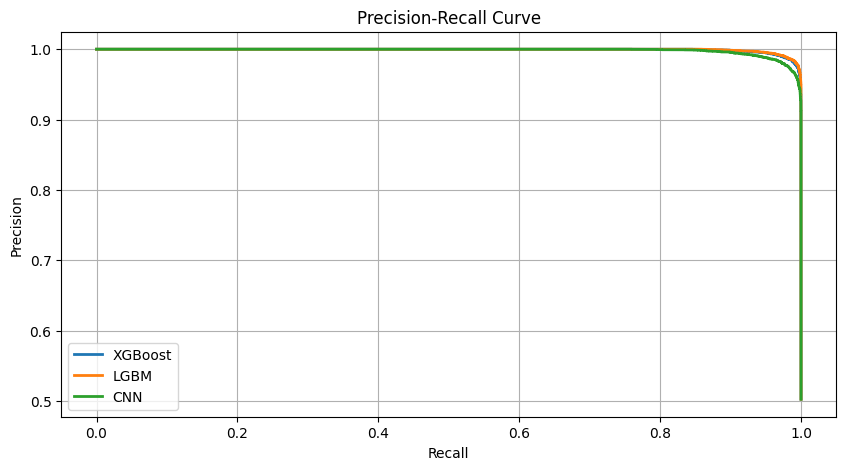

In [313]:
# Precision-recall curve

from sklearn.metrics import precision_recall_curve
import matplotlib.pyplot as plt

# Initialize plot for precision-recall curve
plt.figure(figsize=(10, 5))

# Plot precision-recall curve for each model
for model_name, model_clf in zip(model_names, model_clfs):
    if model_name == 'CNN':
        # For CNN, use predict method
        y_pred = model_clf.predict(X_test_scale)
    else:
        y_pred = model_clf.predict_proba(X_test)[:, 1]

    precision, recall, thresholds = precision_recall_curve(y_test, y_pred)
    plt.plot(recall, precision, lw=2, label=model_name)

# Set labels and title for precision-recall curve
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend(loc='lower left')
plt.grid(True)

# Show precision-recall curve plot
plt.show()


# XAI

## XGBoost

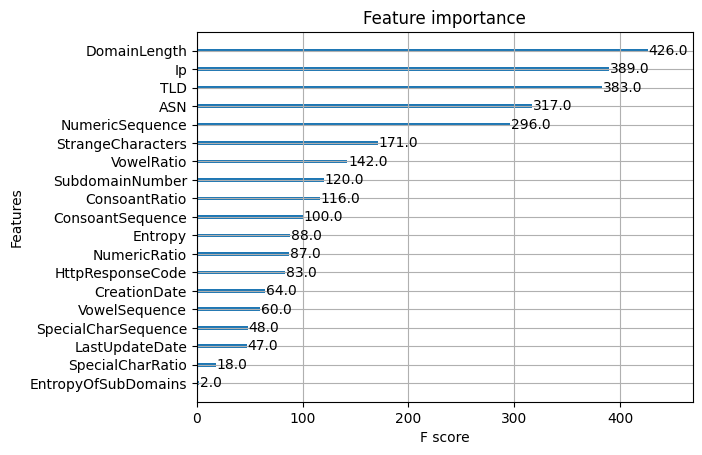

In [216]:
import xgboost as xgb
import matplotlib.pyplot as plt

# Assuming your dataframe is named 'df' and the target variable is named 'Class'
#X = df.drop(columns=['Class'])
#y = df['Class']

# Train XGBoost model
#model = xgb.XGBClassifier()
#model.fit(X, y)

# Plot feature importance
xgb.plot_importance(xgb_clf)
plt.show()


In [155]:
pip install shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 540.5/540.5 kB 5.0 MB/s eta 0:00:00


In [357]:
# Check the shapes of shap_values and X_reshaped_subset
print("Shape of shap_values:", shap_values.shape)
print("Shape of X_reshaped_subset:", X.shape)


Shape of shap_values: (100, 19, 1, 1)
Shape of X_reshaped_subset: (89830, 19)


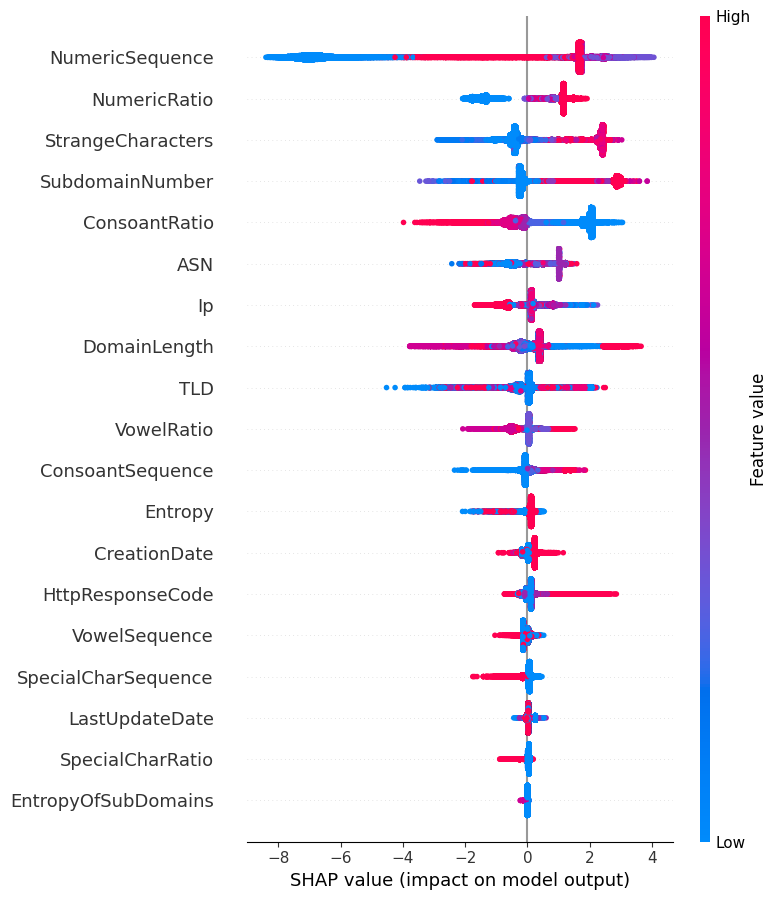

In [346]:
import shap

# Explain model predictions using SHAP
explainer = shap.Explainer(xgb_clf)
shap_values = explainer.shap_values(X)

# Plot SHAP summary plot
shap.summary_plot(shap_values, X)
plt.show()

In [165]:
pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 3.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283835 sha256=06cce0e5eaf6e1f7da176c88fc45db35b1ead12978bed3708635e173fdf50beb
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [384]:
# Define a function to predict using XGBoost model
def predict_fn(X):
    return xgb_clf.predict_proba(X)

# Initialize LIME explainer
explainer = lime.lime_tabular.LimeTabularExplainer(X_train.values,
                                                   feature_names=X_train.columns.tolist(),
                                                   class_names=['Non-Malicious', 'Malicious'],
                                                   discretize_continuous=False)

# Randomly select two samples, one for each category
np.random.seed(42)  # For reproducibility
malicious_sample_idx = np.random.choice(np.where(y_test == 1)[0])
non_malicious_sample_idx = np.random.choice(np.where(y_test == 0)[0])

# Generate explanations for the selected samples
malicious_sample = X_test.iloc[[malicious_sample_idx]]
non_malicious_sample = X_test.iloc[[non_malicious_sample_idx]]

malicious_true_label = y_test.iloc[malicious_sample_idx]
non_malicious_true_label = y_test.iloc[non_malicious_sample_idx]

# Generate explanation for the malicious sample
malicious_explanation = explainer.explain_instance(malicious_sample.values[0],
                                                    predict_fn,
                                                    num_features=len(X_train.columns),
                                                    top_labels=1)  # Specify top_labels=1 for binary classification

# Generate explanation for the non-malicious sample
non_malicious_explanation = explainer.explain_instance(non_malicious_sample.values[0],
                                                        predict_fn,
                                                        num_features=len(X_train.columns),
                                                        top_labels=1)  # Specify top_labels=1 for binary classification

# Visualize explanations
malicious_explanation.show_in_notebook(show_table=True, show_all=False)
non_malicious_explanation.show_in_notebook(show_table=True, show_all=False)


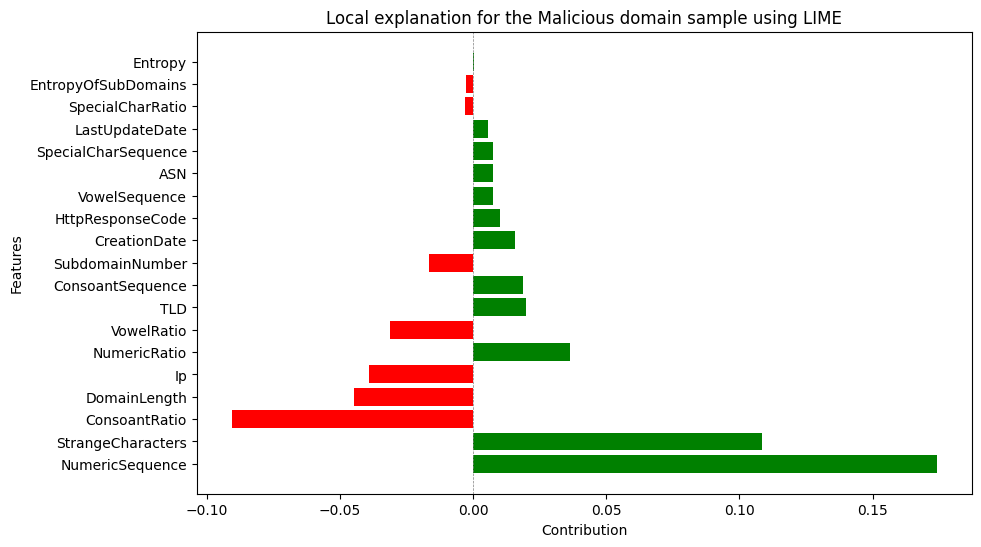

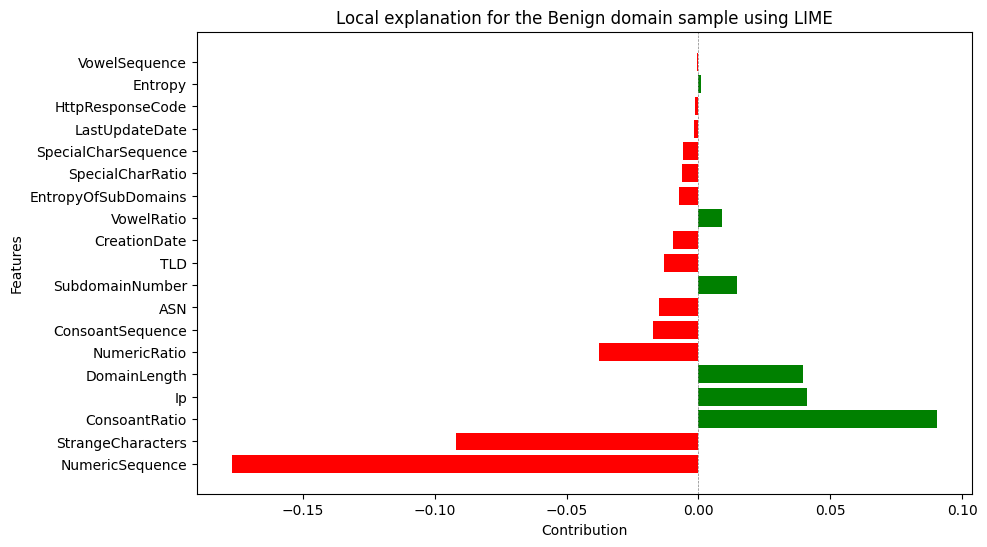

In [385]:
import matplotlib.pyplot as plt

# Function to plot horizontal bar graph with zero centered
def plot_horizontal_bar(explanation, title):
    fig, ax = plt.subplots(figsize=(10, 6))

    # Get feature names and contributions
    features = explanation.as_list(label=explanation.available_labels()[0])
    feature_names = [f[0] for f in features]
    feature_values = [f[1] for f in features]

    # Plot bars
    ax.barh(feature_names, feature_values, color=['red' if val < 0 else 'green' for val in feature_values])

    # Add zero line
    ax.axvline(x=0, color='gray', linestyle='--', linewidth=0.5)

    # Set labels and title
    ax.set_xlabel('Contribution')
    ax.set_ylabel('Features')
    ax.set_title(title)

    # Show plot
    plt.show()

# Plot LIME explanation for the malicious sample
plot_horizontal_bar(malicious_explanation, 'Local explanation for the Malicious domain sample using LIME')

# Plot LIME explanation for the non-malicious sample
plot_horizontal_bar(non_malicious_explanation, 'Local explanation for the Benign domain sample using LIME')


In [223]:
# Global Surrogate Model using Decision Tree for XGB

from sklearn.tree import DecisionTreeClassifier

# Initialize surrogate Decision Tree model
surrogate_model = DecisionTreeClassifier()

# Collect predictions from XGBoost model
predictions = xgb_clf.predict(X_train)  # Assuming X_train is your training dataset

# Train the surrogate Decision Tree model
surrogate_model.fit(X_train, predictions)

# Now you can use the surrogate_model for interpretation


DecisionTreeClassifier()

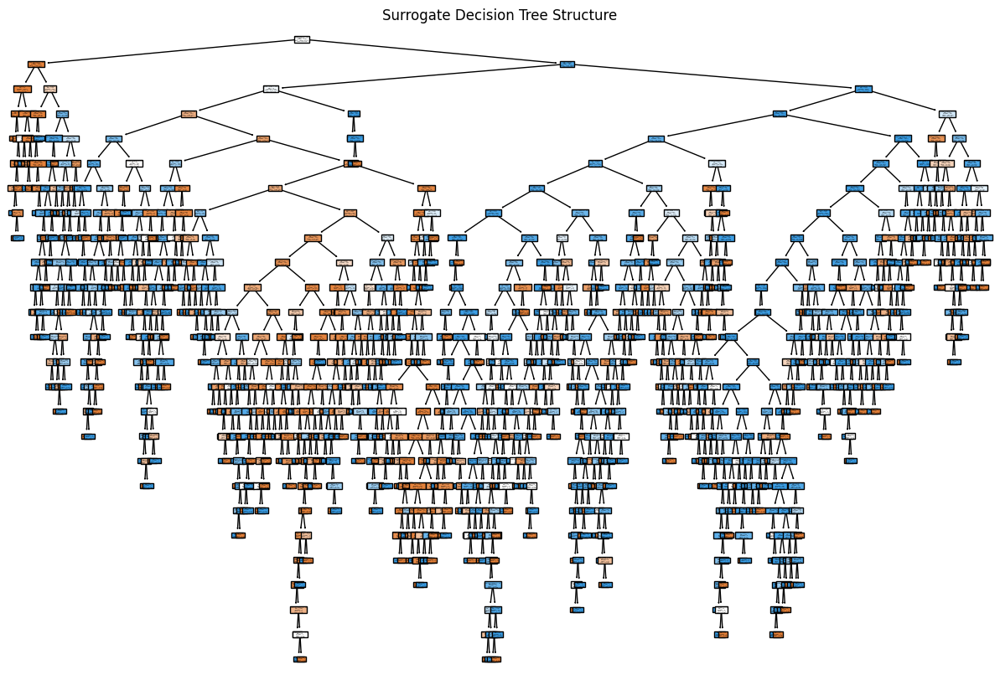

In [228]:
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

# Define class names (assuming binary classification)
class_names = ["Benign", "Malicious"]

# Visualize the decision tree structure of the surrogate model
plt.figure(figsize=(15, 10))
plot_tree(surrogate_model, filled=True, feature_names=X_train.columns, class_names=class_names)
plt.title("Surrogate Decision Tree Structure")
plt.show()


In [238]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score

# Train Decision Tree surrogate model
dt_clf = DecisionTreeClassifier(random_state=42)
dt_clf.fit(X_train, y_train)

# Predict using Decision Tree surrogate model
dt_y_pred = dt_clf.predict(X_test)

# Evaluate Decision Tree surrogate model
print("Decision Tree Surrogate Model:")
print("Accuracy:", accuracy_score(y_test, dt_y_pred))
print("Precision:", precision_score(y_test, dt_y_pred))
print("Recall (Sensitivity):", recall_score(y_test, dt_y_pred))
print("F1-score:", f1_score(y_test, dt_y_pred))
print("ROC AUC:", roc_auc_score(y_test, dt_y_pred))

print("\nFeature importance:\n")
# Feature importance
feature_importance = dt_clf.feature_importances_
sorted_idx = np.argsort(feature_importance)[::-1]
for i in sorted_idx:
    print(X_train.columns[i], ':', feature_importance[i])


Decision Tree Surrogate Model:
Accuracy: 0.979906490036736
Precision: 0.9805879090404881
Recall (Sensitivity): 0.9793928650565035
F1-score: 0.979990022726013
ROC AUC: 0.9799089604924577

Feature importance:

NumericRatio : 0.7775393157079558
ASN : 0.07142592049261492
DomainLength : 0.05663401948575971
NumericSequence : 0.022676883200959782
StrangeCharacters : 0.016322068058541982
ConsoantRatio : 0.0117395885285617
TLD : 0.011498847101360461
Ip : 0.010954502630700814
SubdomainNumber : 0.004015340119500491
ConsoantSequence : 0.0037689115737396255
VowelRatio : 0.003743269723763772
Entropy : 0.002371393170601288
VowelSequence : 0.0021565708051811167
HttpResponseCode : 0.001749295683458065
SpecialCharSequence : 0.0012394281370484586
SpecialCharRatio : 0.0007758212776925382
LastUpdateDate : 0.000713053772835352
CreationDate : 0.0006261680908376222
EntropyOfSubDomains : 4.960243888666605e-05


In [239]:
from sklearn.tree import export_graphviz
import graphviz

# Export the Decision Tree to a Graphviz file
dot_data = export_graphviz(dt_clf, out_file=None,
                           feature_names=X_train.columns,
                           class_names=['Benign', 'Malicious'],
                           filled=True, rounded=True,
                           special_characters=True)

# Visualize the Decision Tree
graph = graphviz.Source(dot_data)
graph.render("decision_tree_surrogate")


# Alternatively, you can also display the tree directly in Jupyter Notebook
graph


In [240]:
# Render and save the graph as an image
graph.render("decision_tree_surrogate", format='png', cleanup=True)

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.493486 to fit


'decision_tree_surrogate.png'

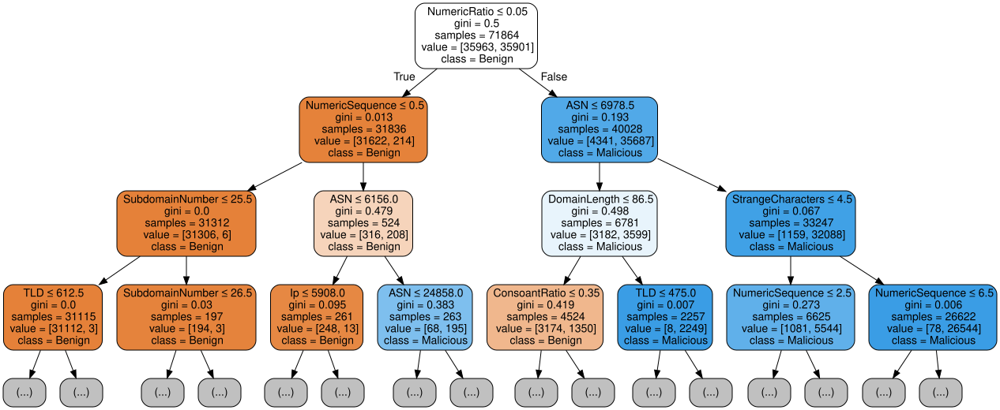

In [242]:
# Export the Decision Tree to a Graphviz file with limited depth
dot_data = export_graphviz(dt_clf, out_file=None,
                           feature_names=X_train.columns,
                           class_names=['Benign', 'Malicious'],
                           filled=True, rounded=True,
                           special_characters=True, max_depth=3)  # Limiting depth to 3 levels

# Visualize the simplified Decision Tree
graph = graphviz.Source(dot_data)

# Render and save the simplified graph as an image
graph.render("simplified_decision_tree_surrogate", format='png', cleanup=True)
graph

## LGBM

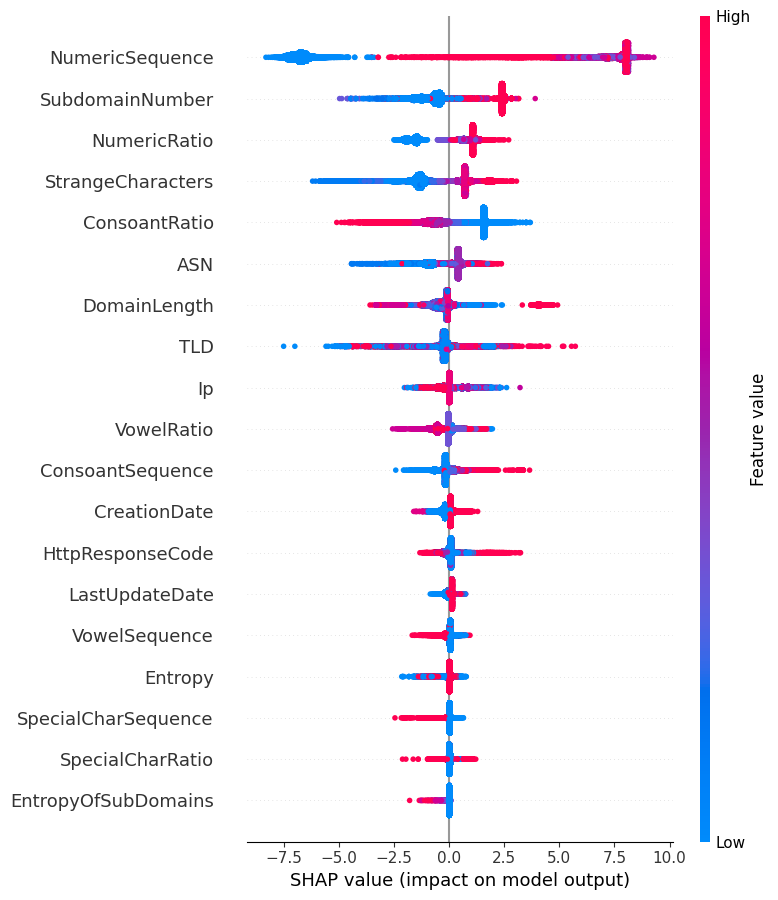

In [375]:
import shap

# Explain model predictions using SHAP
explainer = shap.Explainer(lgbm)
shap_values_lgbm = explainer.shap_values(X)

# Plot SHAP summary plot
shap.summary_plot(shap_values_lgbm, X)
plt.show()

In [376]:
# Define a function to predict using XGBoost model
def predict_fn(X):
    return lgbm.predict_proba(X)

# Initialize LIME explainer
explainer = lime.lime_tabular.LimeTabularExplainer(X_train.values,
                                                   feature_names=X_train.columns.tolist(),
                                                   class_names=['Non-Malicious', 'Malicious'],
                                                   discretize_continuous=False)

# Randomly select two samples, one for each category
np.random.seed(42)  # For reproducibility
malicious_sample_idx = np.random.choice(np.where(y_test == 1)[0])
non_malicious_sample_idx = np.random.choice(np.where(y_test == 0)[0])

# Generate explanations for the selected samples
malicious_sample = X_test.iloc[[malicious_sample_idx]]
non_malicious_sample = X_test.iloc[[non_malicious_sample_idx]]

malicious_true_label = y_test.iloc[malicious_sample_idx]
non_malicious_true_label = y_test.iloc[non_malicious_sample_idx]

# Generate explanation for the malicious sample
malicious_explanation = explainer.explain_instance(malicious_sample.values[0],
                                                    predict_fn,
                                                    num_features=len(X_train.columns),
                                                    top_labels=1)  # Specify top_labels=1 for binary classification

# Generate explanation for the non-malicious sample
non_malicious_explanation = explainer.explain_instance(non_malicious_sample.values[0],
                                                        predict_fn,
                                                        num_features=len(X_train.columns),
                                                        top_labels=1)  # Specify top_labels=1 for binary classification

# Visualize explanations
malicious_explanation.show_in_notebook(show_table=True, show_all=False)
non_malicious_explanation.show_in_notebook(show_table=True, show_all=False)


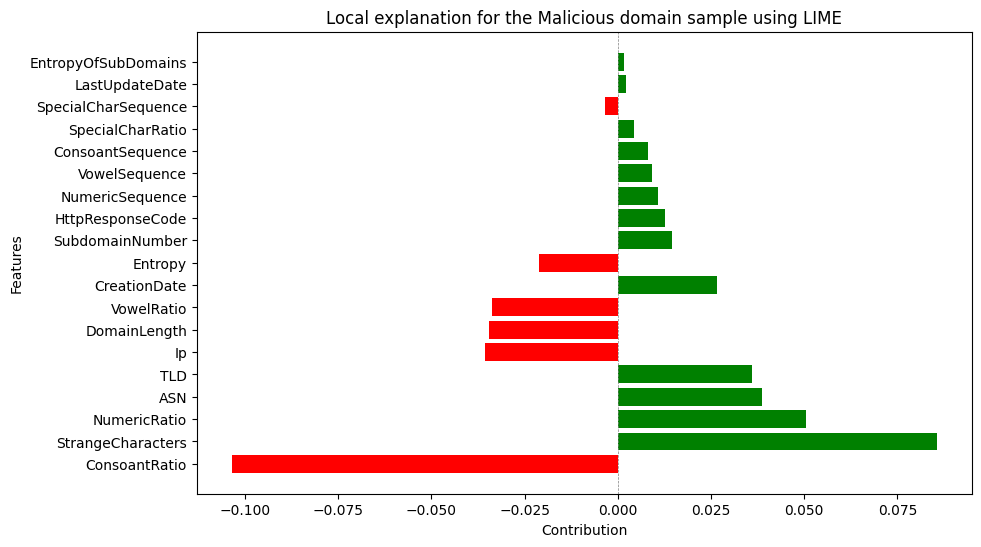

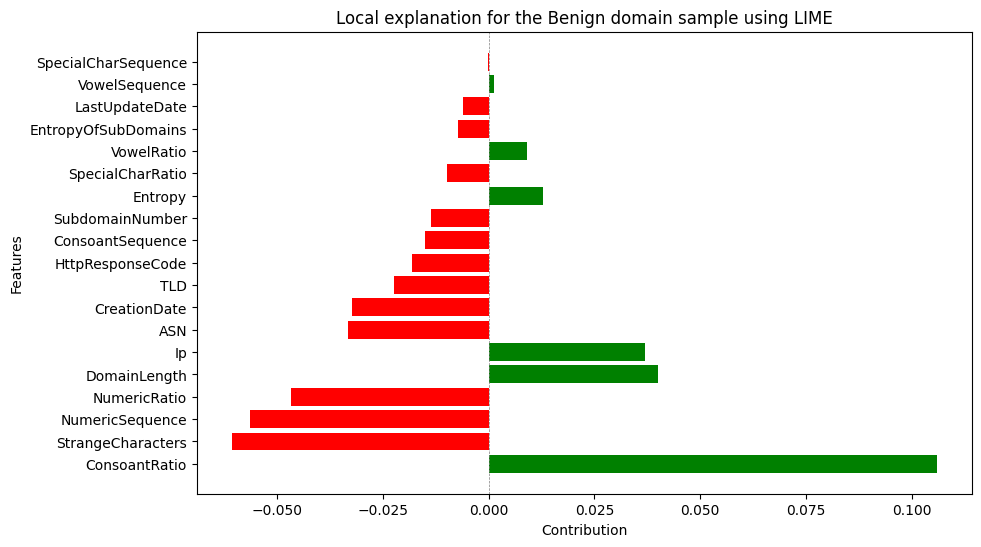

In [377]:
import matplotlib.pyplot as plt

# Function to plot horizontal bar graph with zero centered
def plot_horizontal_bar(explanation, title):
    fig, ax = plt.subplots(figsize=(10, 6))

    # Get feature names and contributions
    features = explanation.as_list(label=explanation.available_labels()[0])
    feature_names = [f[0] for f in features]
    feature_values = [f[1] for f in features]

    # Plot bars
    ax.barh(feature_names, feature_values, color=['red' if val < 0 else 'green' for val in feature_values])

    # Add zero line
    ax.axvline(x=0, color='gray', linestyle='--', linewidth=0.5)

    # Set labels and title
    ax.set_xlabel('Contribution')
    ax.set_ylabel('Features')
    ax.set_title(title)

    # Show plot
    plt.show()

# Plot LIME explanation for the malicious sample
plot_horizontal_bar(malicious_explanation, 'Local explanation for the Malicious domain sample using LIME')

# Plot LIME explanation for the non-malicious sample
plot_horizontal_bar(non_malicious_explanation, 'Local explanation for the Benign domain sample using LIME')


In [382]:
# Global Surrogate Model using Decision Tree for XGB

from sklearn.tree import DecisionTreeClassifier

# Initialize surrogate Decision Tree model
surrogate_model = DecisionTreeClassifier()

# Collect predictions from XGBoost model
predictions = lgbm.predict(X_train)  # Assuming X_train is your training dataset

# Train the surrogate Decision Tree model
surrogate_model.fit(X_train, predictions)

# Now you can use the surrogate_model for interpretation


DecisionTreeClassifier()

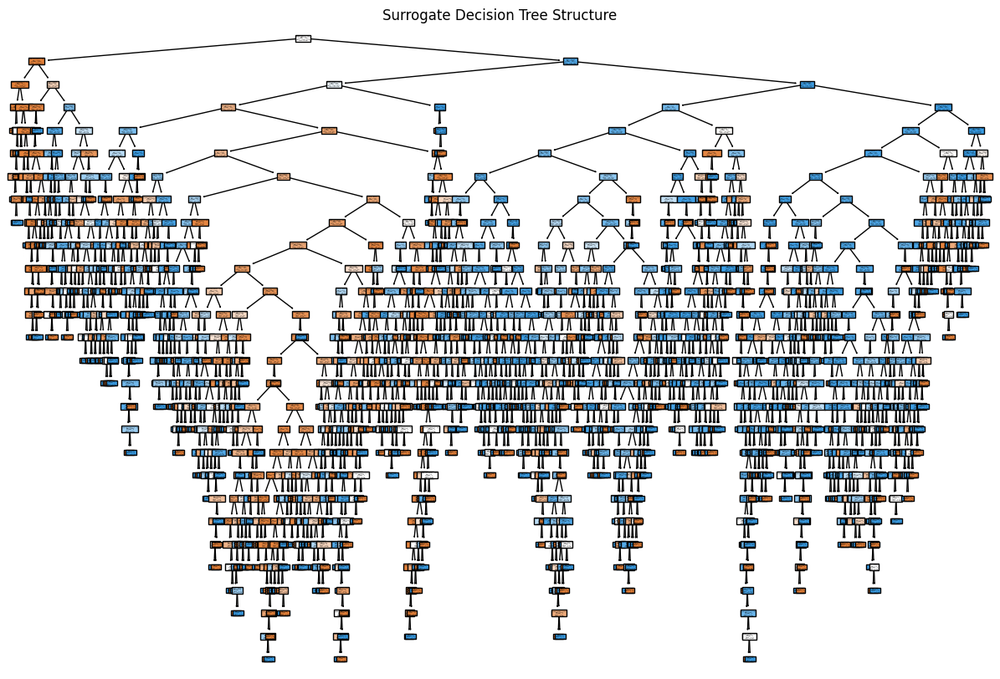

In [379]:

from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

# Define class names (assuming binary classification)
class_names = ["Benign", "Malicious"]

# Visualize the decision tree structure of the surrogate model
plt.figure(figsize=(15, 10))
plot_tree(surrogate_model, filled=True, feature_names=X_train.columns, class_names=class_names)
plt.title("Surrogate Decision Tree Structure")
plt.show()


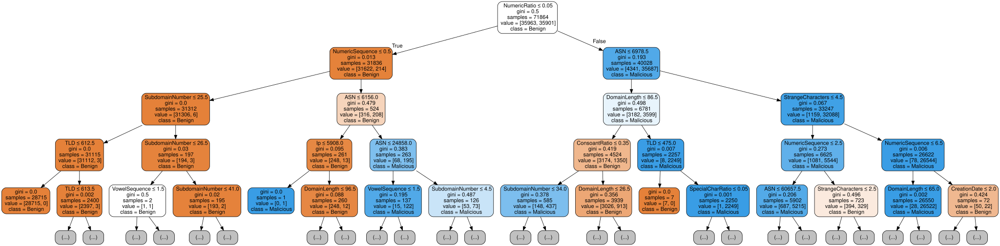

In [383]:

# Export the Decision Tree to a Graphviz file with limited depth
dot_data = export_graphviz(dt_clf, out_file=None,
                           feature_names=X_train.columns,
                           class_names=['Benign', 'Malicious'],
                           filled=True, rounded=True,
                           special_characters=True, max_depth=4)  # Limiting depth to 3 levels

# Visualize the simplified Decision Tree
graph = graphviz.Source(dot_data)

# Render and save the simplified graph as an image
graph.render("simplified_decision_tree_surrogate_lgbm", format='png', cleanup=True)
graph

## CNN

157/157 [==============================] - 1s 8ms/step


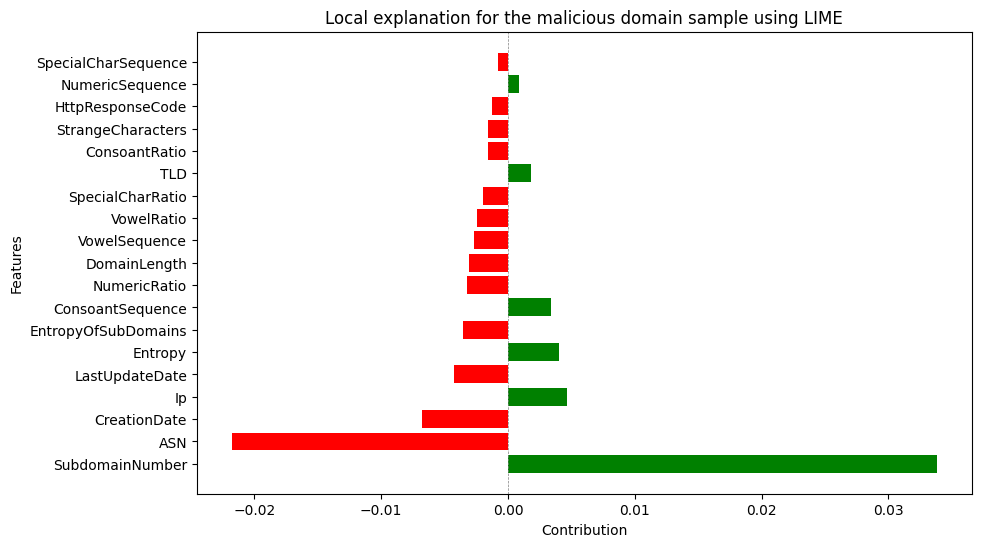

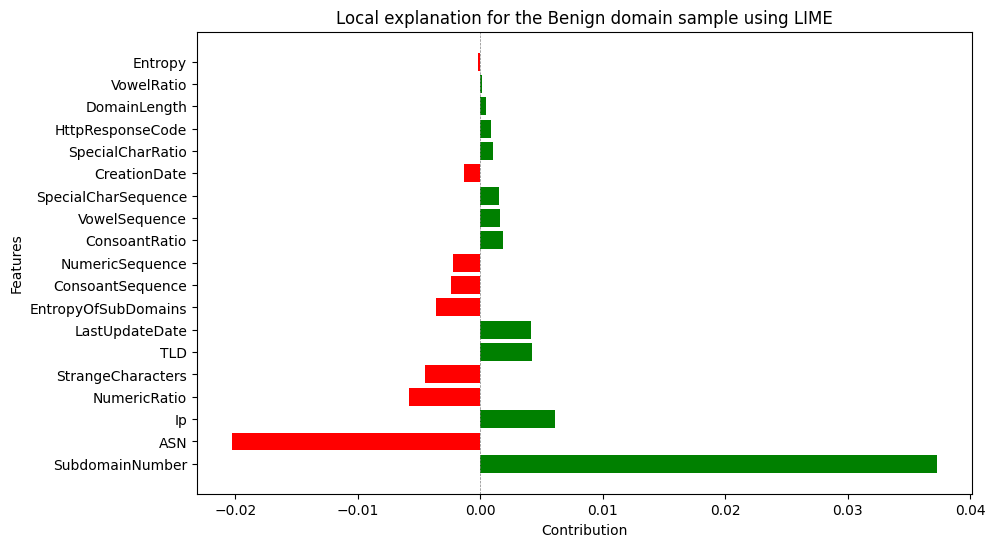

In [269]:
from lime.lime_tabular import LimeTabularExplainer
import numpy as np

# Define a function to predict using your CNN model
def predict_fn(X):
    # Reshape input for CNN model
    X_reshaped = X.reshape(X.shape[0], X.shape[1], 1)
    # Predict probabilities for each class
    return model.predict(X_reshaped)

# Get feature names
feature_names = X_train.columns.tolist()

# Initialize LIME explainer with feature names
explainer = LimeTabularExplainer(X_train.values,
                                 feature_names=feature_names,
                                 class_names=['Benign', 'Malicious'],
                                 discretize_continuous=False)

# Randomly select two samples, one for each category
np.random.seed(42)  # For reproducibility
malicious_sample_idx = np.random.choice(np.where(y_test == 1)[0])
non_malicious_sample_idx = np.random.choice(np.where(y_test == 0)[0])

# Generate explanations for the selected samples
malicious_sample = X_test.iloc[[malicious_sample_idx]]
non_malicious_sample = X_test.iloc[[non_malicious_sample_idx]]

malicious_true_label = y_test.iloc[malicious_sample_idx]
non_malicious_true_label = y_test.iloc[non_malicious_sample_idx]

# Generate explanation for the malicious sample
malicious_explanation = explainer.explain_instance(malicious_sample.values[0],
                                                    predict_fn,
                                                    num_features=len(feature_names),
                                                    top_labels=1)  # Specify top_labels=1 for binary classification

# Generate explanation for the non-malicious sample
non_malicious_explanation = explainer.explain_instance(non_malicious_sample.values[0],
                                                        predict_fn,
                                                        num_features=len(feature_names),
                                                        top_labels=1)  # Specify top_labels=1 for binary classification

# Visualize explanations
malicious_explanation.show_in_notebook(show_table=True, show_all=False)
non_malicious_explanation.show_in_notebook(show_table=True, show_all=False)

import matplotlib.pyplot as plt

# Function to plot horizontal bar graph with zero centered
def plot_horizontal_bar(explanation, title):
    fig, ax = plt.subplots(figsize=(10, 6))

    # Get feature names and contributions
    features = explanation.as_list(label=explanation.available_labels()[0])
    feature_names = [f[0] for f in features]
    feature_values = [f[1] for f in features]

    # Plot bars
    ax.barh(feature_names, feature_values, color=['red' if val < 0 else 'green' for val in feature_values])

    # Add zero line
    ax.axvline(x=0, color='gray', linestyle='--', linewidth=0.5)

    # Set labels and title
    ax.set_xlabel('Contribution')
    ax.set_ylabel('Features')
    ax.set_title(title)

    # Show plot
    plt.show()

# Plot LIME explanation for the malicious sample
plot_horizontal_bar(malicious_explanation, 'Local explanation for the malicious domain sample using LIME')

# Plot LIME explanation for the non-malicious sample
plot_horizontal_bar(non_malicious_explanation, 'Local explanation for the Benign domain sample using LIME')


In [273]:
pip install tf-explain

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.6/43.6 kB 1.1 MB/s eta 0:00:00


In [363]:
# Convert DataFrame to numpy array
X_numpy = X.values

# Reshape the input data for CNN input
X_reshaped = X_numpy.reshape(X_numpy.shape[0], X_numpy.shape[1], 1)

# Select only the first 100 samples
X_reshaped_subset = X_reshaped[:100]

In [371]:
import shap

# Use only the first 1000 samples
X_test_scale_subset = X_test_scale[:100]

# Compute SHAP values using only the subset of samples
shap_values_subset = explainer.shap_values(X_test_scale_subset)

# Check the shapes of SHAP values and input features
print("SHAP values shape:", [sv.shape for sv in shap_values_subset])
print("Input features shape:", X_test_scale_subset.shape)

SHAP values shape: [(19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 1), (19, 1, 

In [373]:
import numpy as np

# Reshape SHAP values to match the shape of input features
shap_values_reshaped = [sv[:, 0, 0] for sv in shap_values_subset]

# Visualize SHAP values for the subset of samples
shap.summary_plot(shap_values_reshaped, X_test_scale_subset)


IndexError: tuple index out of range